<a href="https://colab.research.google.com/github/AndreiAf02/Cholera_Final/blob/main/Cholera_Compliance.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [1]:
%pylab inline
%config InlineBackend.figure_format = 'retina'
from ipywidgets import interact
import scipy.stats as stats
import pandas as pd
import pymc as pm
import seaborn as sns
# from scipy.interpolate import CubicSpline
from scipy.interpolate import splrep, BSpline, CubicSpline


import scipy.integrate
from pymc.ode import DifferentialEquation
from scipy.integrate import odeint


Populating the interactive namespace from numpy and matplotlib


In [2]:
path_to_data = 'https://raw.githubusercontent.com/AndreiAf02/Cholera_Final/main/'
data_all = pd.read_csv(path_to_data + "Cholera_Case_Data.csv", sep=",", header=0)
data_all

,Date,Day,Burundi,Comoros,Ethiopia,Kenya,Malawi,Mozambique,Somalia,Sudan,Zambia,Zimbabwe,Unnamed: 12,Unnamed: 13
0,2023-01-06,1,12.0,NaN,NaN,347.0,3055.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,2023-01-13,8,51.0,NaN,NaN,NaN,4076.0,1014.0,NaN,NaN,NaN,NaN,NaN,NaN
2,2023-01-21,16,51.0,NaN,NaN,633.0,4915.0,762.0,NaN,NaN,NaN,NaN,NaN,NaN
3,2023-01-27,22,NaN,NaN,NaN,356.0,3700.0,480.0,703.0,NaN,11.0,NaN,NaN,NaN
4,2023-02-03,29,NaN,NaN,NaN,205.0,4426.0,346.0,NaN,NaN,16.0,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
61,2024-04-14,465,10.0,218.0,1250.0,NaN,13.0,306.0,NaN,NaN,254.0,586.0,NaN,NaN
62,2024-04-20,471,5.0,982.0,NaN,NaN,13.0,235.0,630.0,NaN,177.0,589.0,NaN,NaN
63,2024-04-28,479,9.0,729.0,2640.0,NaN,10.0,200.0,735.0,2325.0,168.0,750.0,NaN,NaN
64,2024-05-05,486,13.0,1366.0,769.0,NaN,2.0,114.0,711.0,NaN,55.0,393.0,NaN,NaN


Text(0.5, 1.0, 'Burundi')

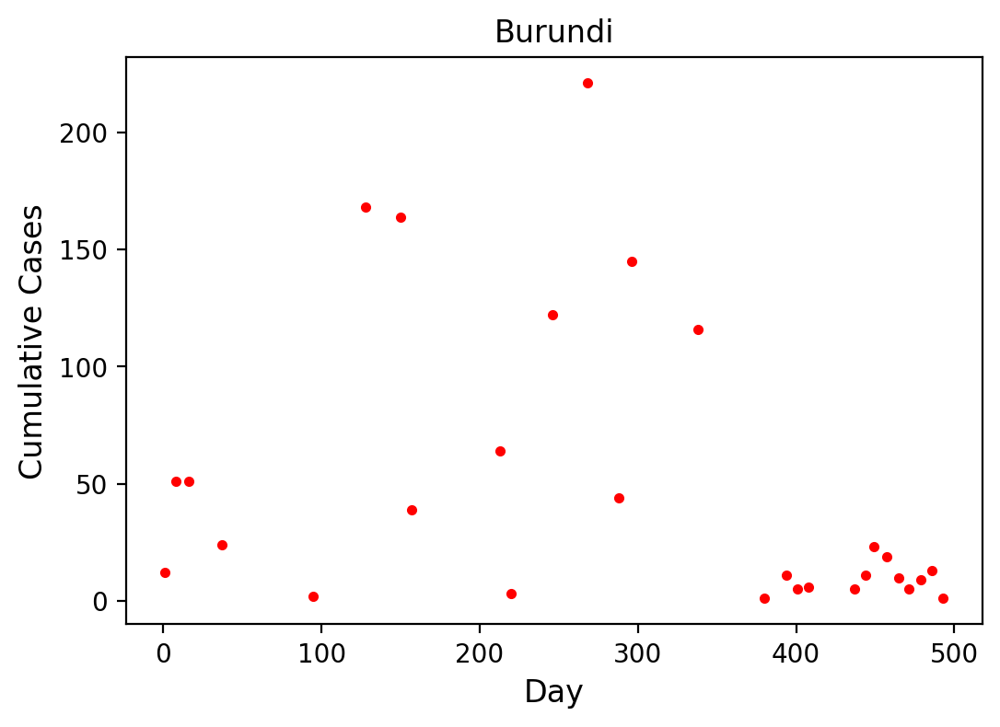

In [ ]:
figure(1, [6, 4])
plot(data_all['Day'], data_all['Burundi'], 'r.')
xlabel('Day', fontsize=12)
ylabel('Cumulative Cases', fontsize=12);
title('Burundi')

Text(0.5, 1.0, 'Comoros')

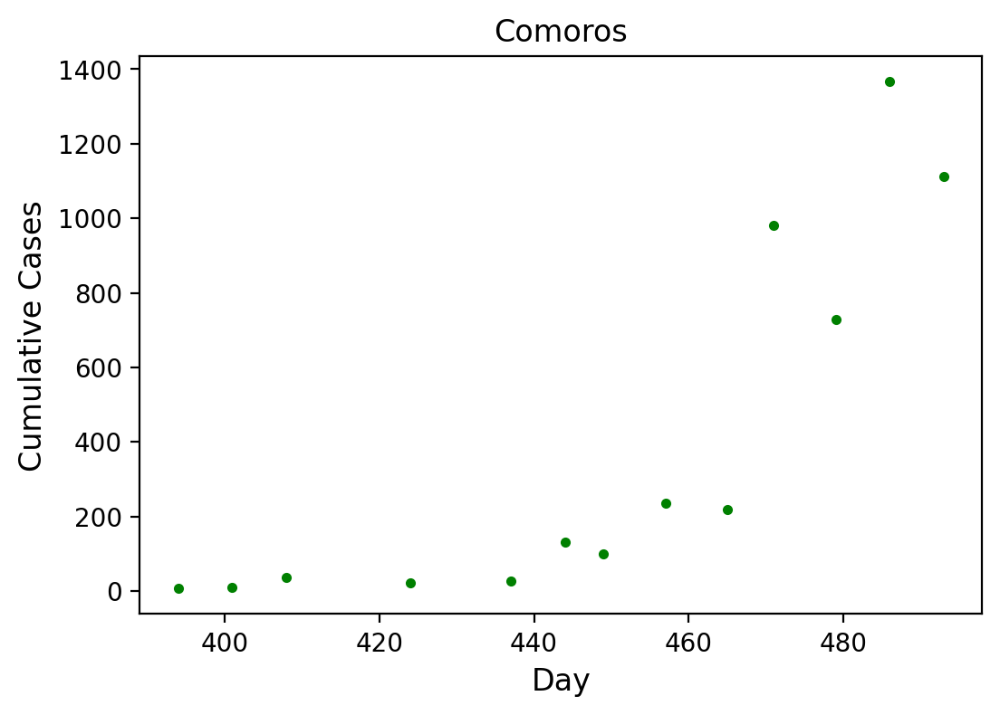

In [ ]:
figure(1, [6, 4])
plot(data_all['Day'], data_all['Comoros'], 'g.')
xlabel('Day', fontsize=12)
ylabel('Cumulative Cases', fontsize=12);
title('Comoros')

Text(0.5, 1.0, 'Ethiopia')

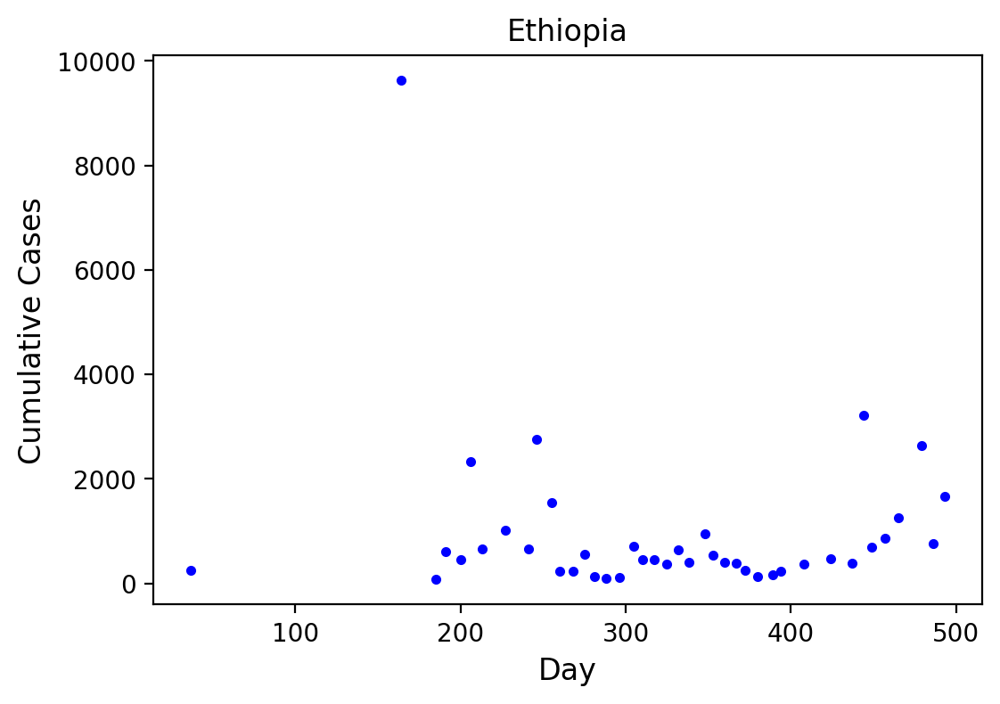

In [ ]:
figure(1, [6, 4])
plot(data_all['Day'], data_all['Ethiopia'], 'b.')
xlabel('Day', fontsize=12)
ylabel('Cumulative Cases', fontsize=12);
title('Ethiopia')

Text(0.5, 1.0, 'Kenya')

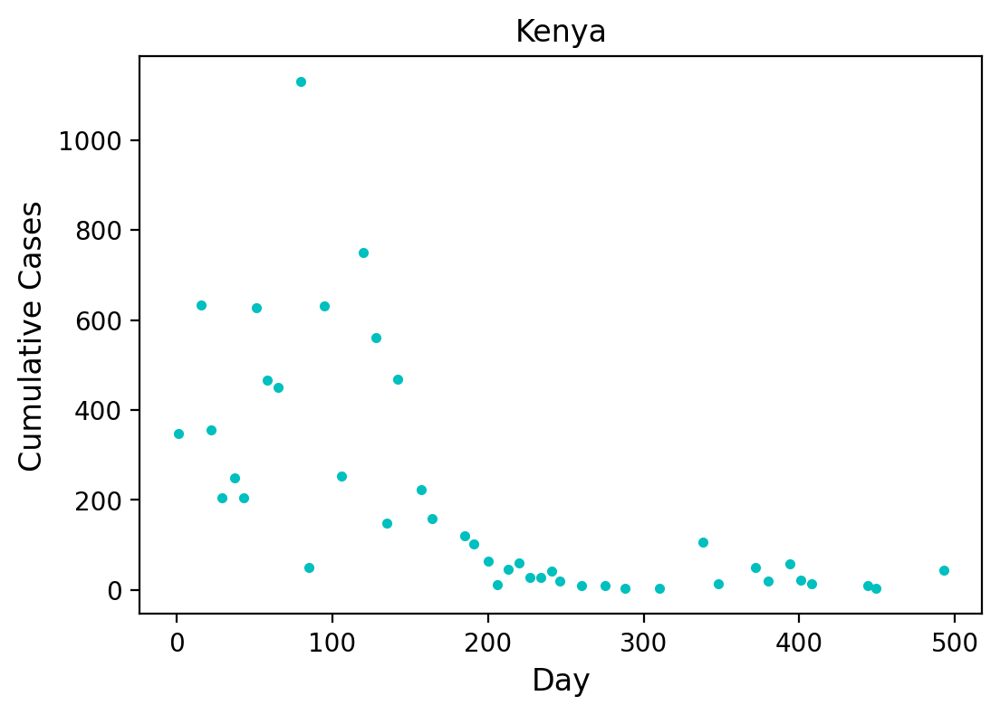

In [ ]:
figure(1, [6, 4])
plot(data_all['Day'], data_all['Kenya'], 'c.')
xlabel('Day', fontsize=12)
ylabel('Cumulative Cases', fontsize=12);
title('Kenya')

Text(0.5, 1.0, 'Malawi')

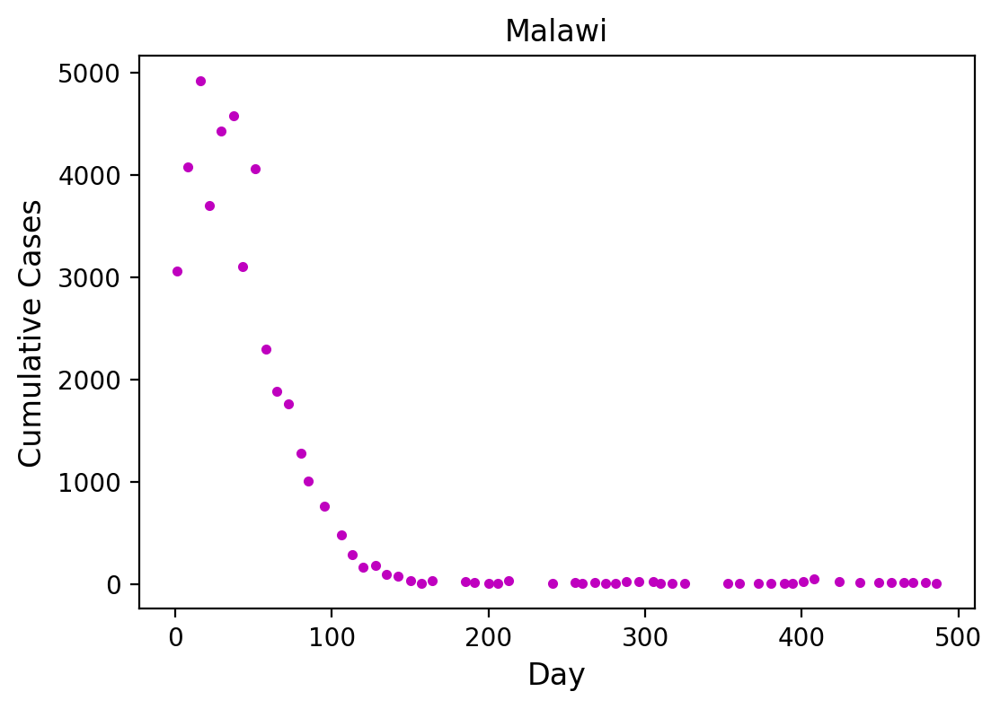

In [ ]:
figure(1, [6, 4])
plot(data_all['Day'], data_all['Malawi'], 'm.')
xlabel('Day', fontsize=12)
ylabel('Cumulative Cases', fontsize=12);
title('Malawi')

Text(0.5, 1.0, 'Mozambique')

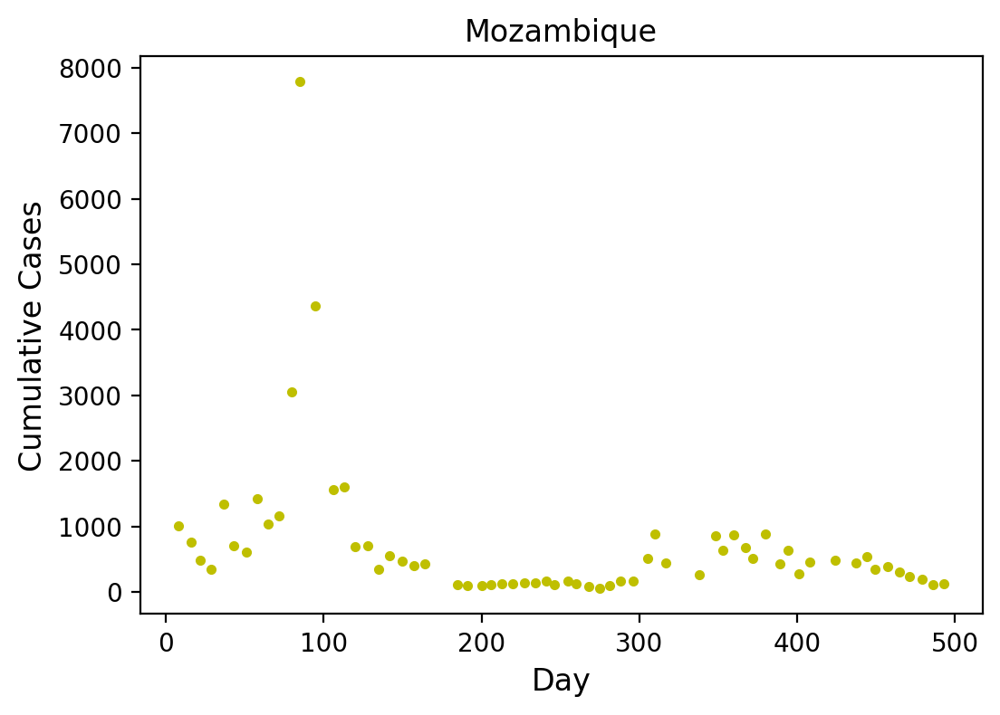

In [ ]:
figure(1, [6, 4])
plot(data_all['Day'], data_all['Mozambique'], 'y.')
xlabel('Day', fontsize=12)
ylabel('Cumulative Cases', fontsize=12);
title('Mozambique')

Text(0.5, 1.0, 'Somalia')

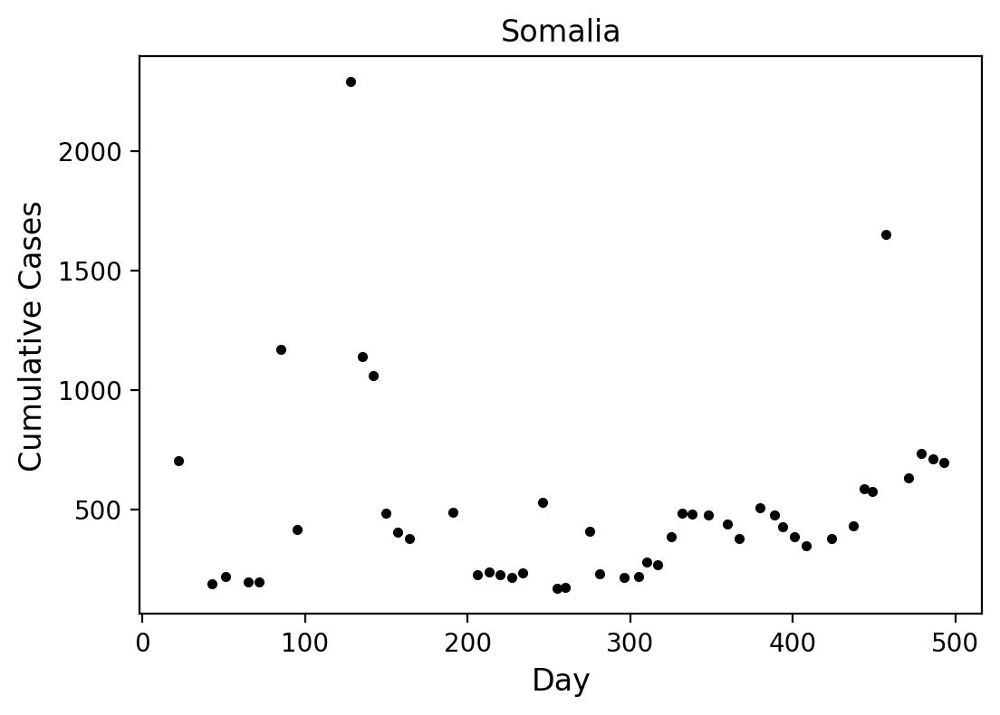

In [ ]:
figure(1, [6, 4])
plot(data_all['Day'], data_all['Somalia'], 'k.')
xlabel('Day', fontsize=12)
ylabel('Cumulative Cases', fontsize=12);
title('Somalia')

Text(0.5, 1.0, 'Sudan')

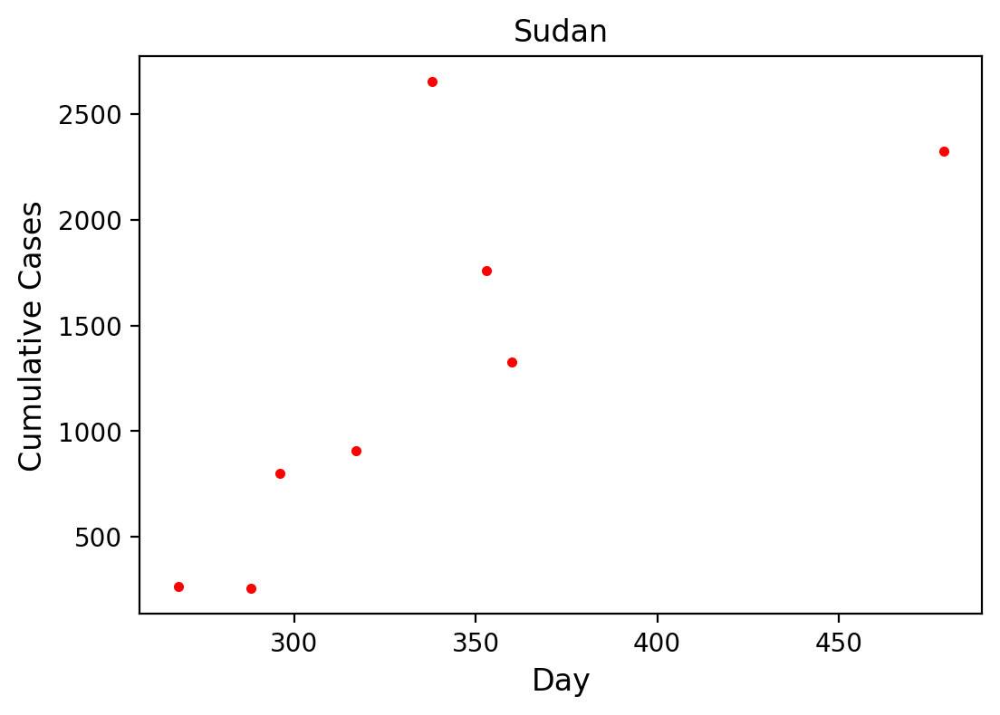

In [ ]:
figure(1, [6, 4])
plot(data_all['Day'], data_all['Sudan'], 'r.')
xlabel('Day', fontsize=12)
ylabel('Cumulative Cases', fontsize=12);
title('Sudan')

Text(0.5, 1.0, 'Zambia')

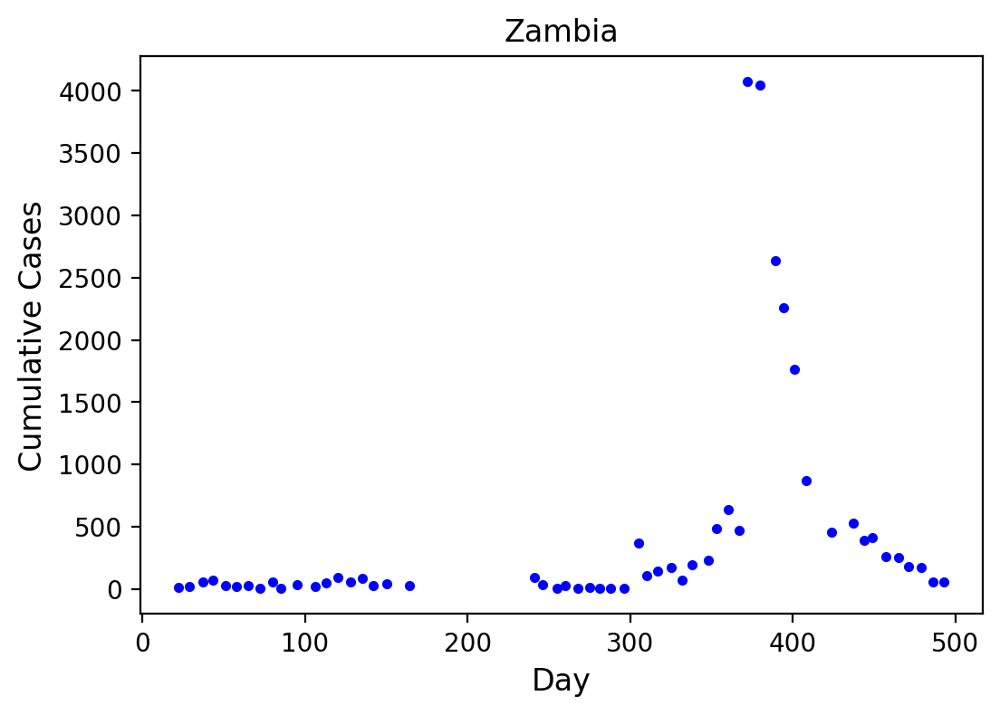

In [ ]:
figure(1, [6, 4])
plot(data_all['Day'], data_all['Zambia'], 'b.')
xlabel('Day', fontsize=12)
ylabel('Cumulative Cases', fontsize=12);
title('Zambia')

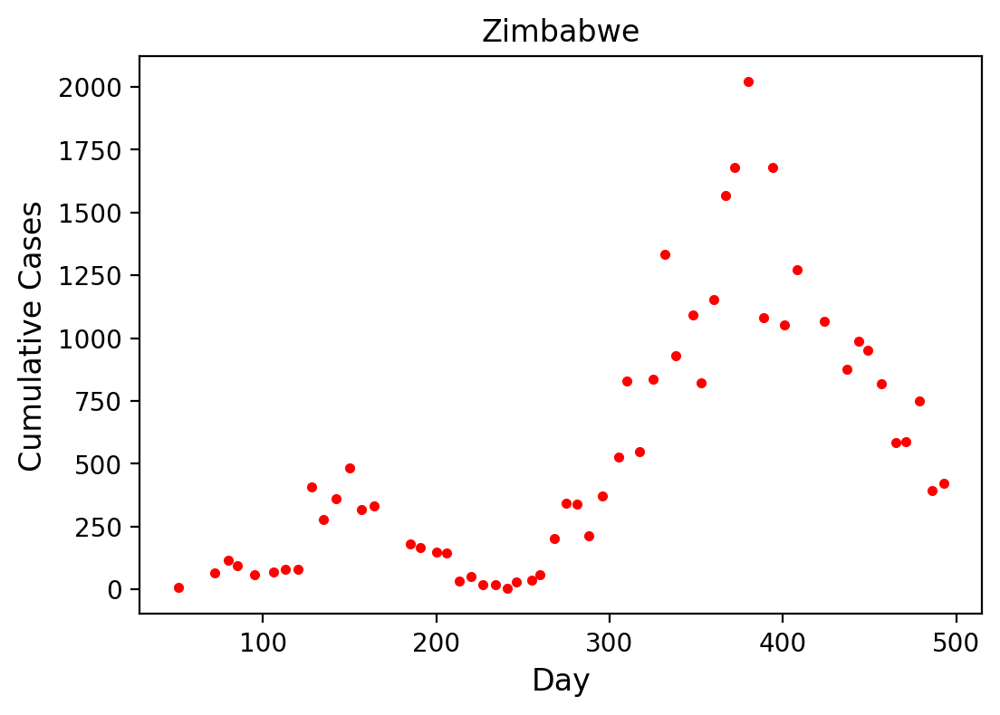

In [ ]:
figure(1, [6, 4])
plot(data_all['Day'], data_all['Zimbabwe'], 'r.')
xlabel('Day', fontsize=12)
ylabel('Cumulative Cases', fontsize=12);
title('Zimbabwe')


data_zimbabwe = data_all.iloc[:,]

    Date  Day  Zimbabwe  Day_new
0      1  241       3.0        1
1      1  246      30.0        6
2      3  255      38.0       15
3      3  260      58.0       20
4      5  268     204.0       28
5      6  275     343.0       35
6      6  281     339.0       41
7      7  288     215.0       48
8      9  296     372.0       56
9     10  305     526.0       65
10    11  310     828.0       70
11    12  317     549.0       77
12    13  325     837.0       85
13    14  332    1332.0       92
14    15  338     930.0       98
15    16  348    1094.0      108
16    17  353     823.0      113
17    18  360    1155.0      120
18    19  367    1568.0      127
19    19  372    1678.0      132
20    21  380    2020.0      140
21    22  389    1080.0      149
22    23  394    1678.0      154
23    24  401    1053.0      161
24    25  408    1273.0      168
25    27  424    1068.0      184
26    29  437     877.0      197
27    30  444     989.0      204
28    30  449     952.0      209
29    32  

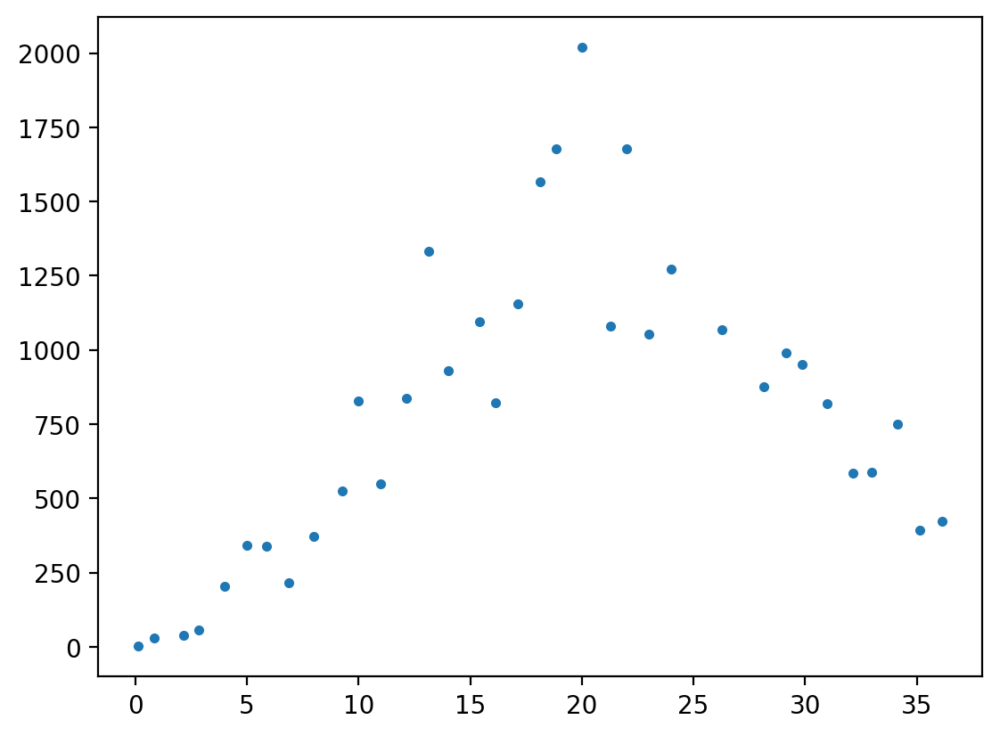

In [ ]:
data_zimb = data_all[data_all['Zimbabwe'].notnull()]

data_zimb = data_zimb.drop(columns=['Burundi', 'Ethiopia', 'Kenya', 'Comoros',
                                          'Mozambique', 'Somalia', 'Malawi', 'Sudan', 'Zambia'])

data_zimb = data_zimb[['Date', 'Day', 'Zimbabwe']].iloc[22:]

data_zimb

data_zimb['Day_new'] = data_zimb['Day']-data_zimb['Day'].min()+1

data_zimb['Date'] = data_zimb['Day_new']//7+1

data_zimb = data_zimb.reset_index(drop=True)

print(data_zimb)

plt.plot(data_zimb['Day_new']/7, data_zimb['Zimbabwe'], '.')

##Haiti:

In [ ]:
data_all_haiti= pd.read_csv(path_to_data + "Haiti_Approx.csv", sep=",", header=0)
data_all_haiti

,Date,PNAS (M),PAHO,PNAS,PAHO_Sum
0,1,12.00,1,12000,1
1,2,7.80,3,7800,3
2,3,15.60,4,15600,4
3,4,15.05,13,15050,13
4,5,15.30,35,15300,35
...,...,...,...,...,...
147,148,NaN,68,0,68
148,149,NaN,86,0,86
149,150,NaN,44,0,44
150,151,NaN,42,0,42


In [ ]:
data_haiti_1 = data_all_haiti.drop(columns=['PAHO', 'PNAS (M)', 'PAHO_Sum'])
data_haiti_1 = data_all_haiti[data_all_haiti['PNAS'].notnull()]

data_haiti_1 = data_haiti_1[data_haiti_1['PNAS'] !=0]

data_haiti_1


data_haiti_2 = data_all_haiti.drop(columns=['PNAS', 'PNAS (M)', 'PAHO'])

data_haiti_2

for i in range(len(data_haiti_2)):
  if data_haiti_2['Date'][i] % 7 ==0:
    data_haiti_2['Date'][i] = data_haiti_2['Date'][i]/7
    data_haiti_2['PAHO_Sum'][i] = data_haiti_2['PAHO_Sum'][i]
  else:
    data_haiti_2['Date'][i] = None
    data_haiti_2['PAHO_Sum'][i] = None

data_haiti_2 = data_haiti_2[data_haiti_2['PAHO_Sum'].notnull()]
data_haiti_2.reset_index(drop=True, inplace=True)
print(data_haiti_2)


    Date  PAHO_Sum
0    1.0     158.0
1    2.0    1089.0
2    3.0    1177.0
3    4.0    1706.0
4    5.0    2611.0
5    6.0    2753.0
6    7.0    2648.0
7    8.0    2543.0
8    9.0    2457.0
9   10.0    2087.0
10  11.0    1420.0
11  12.0    1371.0
12  13.0    1347.0
13  14.0    1509.0
14  15.0    1648.0
15  16.0    1675.0
16  17.0    1285.0
17  18.0    1235.0
18  19.0    1015.0
19  20.0     957.0
20  21.0     793.0


<ipython-input-15-4d564ad8efc2>:18: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  data_haiti_2['Date'][i] = None
<ipython-input-15-4d564ad8efc2>:19: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting 

Text(0.5, 1.0, 'Haiti (PNAS)')

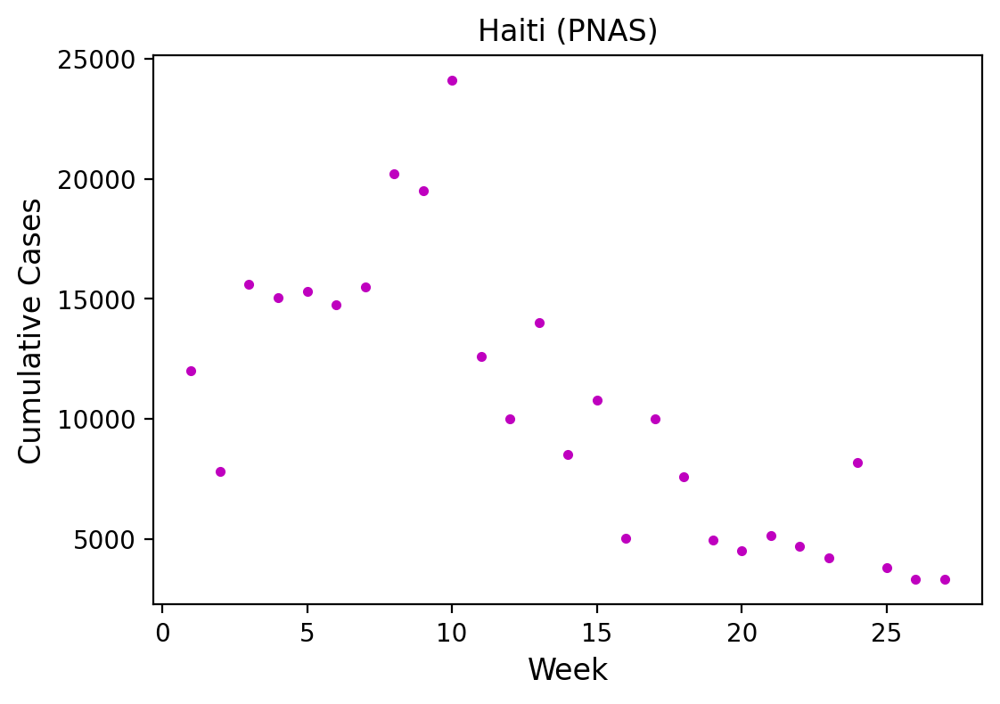

In [ ]:
figure(1, [6, 4])
plot(data_haiti_1['Date'], data_haiti_1['PNAS'], 'm.')
xlabel('Week', fontsize=12)
ylabel('Cumulative Cases', fontsize=12);
title('Haiti (PNAS)')

Text(0.5, 1.0, 'Haiti (PAHO)')

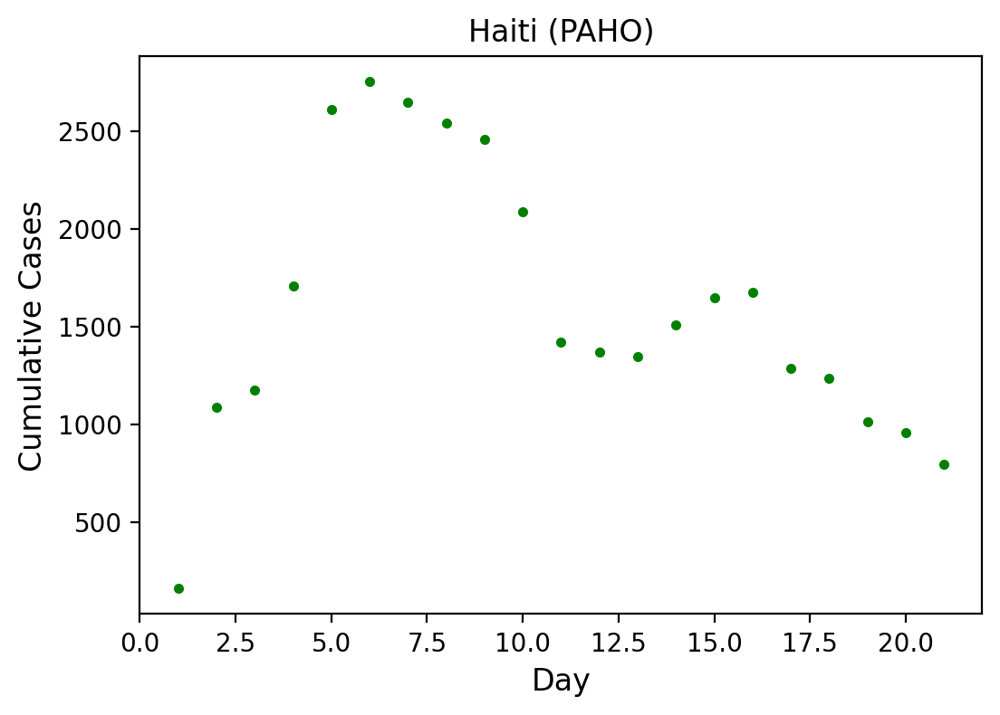

In [ ]:
figure(1, [6, 4])
plot(data_haiti_2['Date'], data_haiti_2['PAHO_Sum'], 'g.')
xlabel('Day', fontsize=12)
ylabel('Cumulative Cases', fontsize=12);
title('Haiti (PAHO)')

## New Model:

In [ ]:
def Cholera_model(y,t, a, thresh, lamb, c_s, c_h, c_f_I, c_f_A, sigma, mu, nu, p_I, p_A, q_I, q_A, r):
    S,I,A,B=y
    if B < thresh:
      alph = 0
    else:
      alph = a*(B-thresh)/((B-thresh)+lamb)
    # alph[n+1]=np.piecewise(B[n], [B[n] < c, B[n] >= c], [0, a*(B[n]-c)/((B[n]-c)+lamb)])
    dS_dt = -(1-c_s)*(1-c_h)*alph*S + mu - (mu+nu)*S
    dI_dt = sigma*(1-c_s)*(1-c_h)*alph*S  - p_I*I - mu*I
    dA_dt = (1-sigma)*(1-c_s)*(1-c_h)*alph*S - p_A*A - mu*A
    dB_dt = r*B*(1-B)+(1-c_f_I)*q_I*I+(1-c_f_A)*q_A*A

    return([dS_dt,dI_dt,dA_dt, dB_dt])


def Cholera_solver(mod, t, a, thresh, lamb, c_s, c_h, c_f_I, c_f_A, sigma, mu, nu, p_I, p_A, q_I, q_A, r, pop):
    Solution = pd.DataFrame()
    sol=scipy.integrate.odeint(mod,[S0,I0,A0,B0],t,args=(a, thresh, lamb, c_s, c_h, c_f_I, c_f_A, sigma, mu, nu, p_I, p_A, q_I, q_A, r))
    sol=np.array(sol)
    Solution['time']=t
    Solution['S(t)']=sol[:,0]*pop
    Solution['I(t)']=sol[:,1]*pop
    Solution['A(t)']=sol[:,2]*pop
    Solution['B(t)']=sol[:,3]*pop
    return Solution


def Cholera_fitter(mod, t, a, thresh, lamb, c_s, c_h, c_f_I, c_f_A, sigma, mu, nu, p_I, p_A, q_I, q_A, r, data, label, pop, burnin):
    SumSq = pd.DataFrame(columns = ['SumSquared'])
    Solution = pd.DataFrame()
    sol=scipy.integrate.odeint(mod,[S0,I0,A0,B0],t,args=(a, thresh, lamb, c_s, c_h, c_f_I, c_f_A, sigma, mu, nu, p_I, p_A, q_I, q_A, r))
    sol=np.array(sol)
    Solution['time']=t
    Solution['S(t)']=sol[:,0]*pop
    Solution['I(t)']=sol[:,1]*pop
    Solution['A(t)']=sol[:,2]*pop
    Solution['B(t)']=sol[:,2]*pop
    Sum=0
    for j in range(len(data)): #data['Date'].max()):
      for i in range(len(t)):
        # print(i)
        if Solution['time'][i]==data['Date'][j]+burnin: #data['Date'][j]:
          diff = (Solution['I(t)'][i]-data[label][j])**2
        else:
          diff = 0
        Sum = Sum+diff
    return Sum
    print(Sum)

def conf_int(ParamFit):
  ParamFit_mirror = pd.DataFrame()
  ParamFit_mirror = -ParamFit['SumSq']+2*ParamFit['SumSq'].min()
  ParamFit_mirror = pd.concat([ParamFit_mirror, ParamFit['SumSq']])
  ParamFit_mirror
  plt.hist(ParamFit_mirror, bins=50)
  plt.show()
  var = np.var(ParamFit_mirror, ddof=1)
  var_mean = var/len(ParamFit_mirror)
  se_mean = np.sqrt(var_mean)
  error_bound = 1.96*se_mean
  print(error_bound)
  return error_bound


def CI_func(ParamFit, country, label, burnin, data, column, day_label, day):
  BestFit = pd.DataFrame()
  BestFit = ParamFit.loc[ParamFit['SumSq']==ParamFit['SumSq'].min()]
  BestFit2 = BestFit.iloc[0, :].values.flatten().tolist()
  a = BestFit2[1]
  lamb = BestFit2[2]
  sigma = BestFit2[3]
  ratio = BestFit2[4]
  # burnin = BestFit2[5]
  q_A = q_I/ratio

  error_bound = conf_int(ParamFit)
  ParamFit_CI = ParamFit[ParamFit['SumSq']<=ParamFit['SumSq'].min()+error_bound/2]

  sns.boxplot(ParamFit_CI[['Aval', 'Lambda', 'Sigma', 'Ratio']])

  CI_plots = pd.DataFrame()
  for i in range(len(ParamFit_CI)):
    a = ParamFit_CI.iloc[i, 1]
    lamb = ParamFit_CI.iloc[i, 2]
    sigma = ParamFit_CI.iloc[i, 3]
    ratio = ParamFit_CI.iloc[i, 4]
    output = Cholera_solver(Cholera_model, t, a, thresh, lamb, c_s, c_h, c_f_I, c_f_A, sigma, mu, nu, p_I, p_A, q_I, q_A, r, pop)
    CI_plots.loc[:,0] = output['time']
    CI_plots.loc[:,i+1] = output['I(t)']

  CI_plots_min = pd.DataFrame()
  CI_plots_max = pd.DataFrame()
  CI_plots_min.loc[:,0] = CI_plots.iloc[:,0]
  for i in range(len(CI_plots)):
    CI_plots_min.loc[i,1] = CI_plots.iloc[i,1:].min()
  # CI_plots_min.loc[:,1] = CI_plots.iloc[:, CI_plots.iloc[:,1:].idxmin(axis=1)[compint]]
  CI_plots_max.loc[:,0] = CI_plots.iloc[:,0]
  for i in range(len(CI_plots)):
    CI_plots_max.loc[i,1] = CI_plots.iloc[i,1:].max()
  # CI_plots_max.loc[:,1] = CI_plots.iloc[:, CI_plots.iloc[:,1:].idxmax(axis=1)[compint]]

  fig, ax = plt.subplots()
  plt.title(country)
  ax.plot(output_fit['time'], output_fit['I(t)'], 'b-', label='I(t)')
  ax.fill_between(CI_plots.iloc[:,0], CI_plots_min.iloc[:,1], CI_plots_max.iloc[:,1], color='gold', alpha=0.7, label='95% CI of Fit')
  ax.plot(data[day_label]/day+burnin, data[column], 'm.', label=label)
  plt.xlabel('Week')
  plt.ylabel('Cases')
  plt.legend()

In [ ]:
def Cholera_solver_cumul(mod, t, a, thresh, lamb, c_s, c_h, c_f_I, c_f_A, sigma, mu, nu, p_I, p_A, q_I, q_A, r, data, label, pop, burnin):
    SumSq = pd.DataFrame(columns = ['SumSquared'])
    Solution = pd.DataFrame()
    sol=scipy.integrate.odeint(mod,[S0,I0,A0,B0],t,args=(a, thresh, lamb, c_s, c_h, c_f_I, c_f_A, sigma, mu, nu, p_I, p_A, q_I, q_A, r))
    sol=np.array(sol)
    Solution['time']=t
    Solution['S(t)']=sol[:,0]*pop
    Solution['I(t)']=sol[:,1]*pop
    Solution['A(t)']=sol[:,2]*pop
    Solution['B(t)']=sol[:,2]*pop

    for i in range(len(Solution)):
      if abs(Solution['time'][i]-round(Solution['time'][i],0))>0.001:
        Solution = Solution.drop([i])
    Solution = Solution.reset_index(drop=True)
    Solution['I(t)_cumul'] = np.cumsum(Solution['I(t)'])
    Solution['A(t)_cumul'] = np.cumsum(Solution['A(t)'])
    return Solution

def Cholera_fitter_cumul(mod, t, a, thresh, lamb, c_s, c_h, c_f_I, c_f_A, sigma, mu, nu, p_I, p_A, q_I, q_A, r, data, label, pop, burnin):
    SumSq = pd.DataFrame(columns = ['SumSquared'])
    Solution = pd.DataFrame()
    sol=scipy.integrate.odeint(mod,[S0,I0,A0,B0],t,args=(a, thresh, lamb, c_s, c_h, c_f_I, c_f_A, sigma, mu, nu, p_I, p_A, q_I, q_A, r))
    sol=np.array(sol)
    Solution['time']=t
    Solution['S(t)']=sol[:,0]*pop
    Solution['I(t)']=sol[:,1]*pop
    Solution['A(t)']=sol[:,2]*pop
    Solution['B(t)']=sol[:,2]*pop

    for i in range(len(Solution)):
      if abs(Solution['time'][i]-round(Solution['time'][i],0))>0.001:
        Solution = Solution.drop([i])
    Solution = Solution.reset_index(drop=True)
    Solution['I(t)_cumul'] = np.cumsum(Solution['I(t)'])
    Solution['A(t)_cumul'] = np.cumsum(Solution['A(t)'])
    # return Solution
    # return len(Solution)
    Sum=0
    for j in range(len(data)): #data['Date'].max()):
      for i in range(len(Solution)):
        # print(i)
        if Solution['time'][i]==data['Date'][j]+burnin: #data['Date'][j]:
          diff = (Solution['I(t)_cumul'][i]-data[label][j])**2
        else:
          diff = 0
        Sum = Sum+diff
    return Sum
    print(Sum)



def CI_func_cumul(ParamFit, country, label, burnin, data, column, day_label, day):
  BestFit = pd.DataFrame()
  BestFit = ParamFit.loc[ParamFit['SumSq']==ParamFit['SumSq'].min()]
  BestFit2 = BestFit.iloc[0, :].values.flatten().tolist()
  a = BestFit2[1]
  lamb = BestFit2[2]
  sigma = BestFit2[3]
  ratio = BestFit2[4]
  # burnin = BestFit2[5]
  q_A = q_I/ratio

  error_bound = conf_int(ParamFit)
  ParamFit_CI = ParamFit[ParamFit['SumSq']<=ParamFit['SumSq'].min()+error_bound/2]

  # sns.boxplot(ParamFit_CI[['Aval', 'Lambda', 'Sigma', 'Ratio']])

  CI_plots = pd.DataFrame()
  for i in range(len(ParamFit_CI)):
    a = ParamFit_CI.iloc[i, 1]
    lamb = ParamFit_CI.iloc[i, 2]
    sigma = ParamFit_CI.iloc[i, 3]
    ratio = ParamFit_CI.iloc[i, 4]
    output = Cholera_solver_cumul(Cholera_model, t, a, thresh, lamb, c_s, c_h, c_f_I, c_f_A, sigma, mu, nu, p_I, p_A, q_I, q_A, r, data, column, pop, burnin)
    CI_plots.loc[:,0] = output['time']
    CI_plots.loc[:,i+1] = output['I(t)_cumul']

  CI_plots_min = pd.DataFrame()
  CI_plots_max = pd.DataFrame()
  CI_plots_min.loc[:,0] = CI_plots.iloc[:,0]
  for i in range(len(CI_plots)):
    CI_plots_min.loc[i,1] = CI_plots.iloc[i,1:].min()
  # CI_plots_min.loc[:,1] = CI_plots.iloc[:, CI_plots.iloc[:,1:].idxmin(axis=1)[compint]]
  CI_plots_max.loc[:,0] = CI_plots.iloc[:,0]
  for i in range(len(CI_plots)):
    CI_plots_max.loc[i,1] = CI_plots.iloc[i,1:].max()
  # CI_plots_max.loc[:,1] = CI_plots.iloc[:, CI_plots.iloc[:,1:].idxmax(axis=1)[compint]]

  fig, ax = plt.subplots()
  plt.title(country)
  ax.plot(cumul_fit['time'], cumul_fit['I(t)_cumul'], 'b-', label='I(t)')
  ax.fill_between(CI_plots.iloc[:,0], CI_plots_min.iloc[:,1], CI_plots_max.iloc[:,1], color='gold', alpha=0.7, label='95% CI of Fit')
  ax.plot(data[day_label]/day+burnin, data[column]+cumul_fit['I(t)_cumul'][burnin], 'm.', label=label)
  plt.xlabel('Week')
  plt.ylabel('Cases')
  plt.legend()

## Compliance matrix:

In [ ]:
## Compliance

comp = 0.70
vax = 0.005

comp1 = [['Water-Food & Handwashing', comp, comp, 0.05, 0.05, 0], ['Water-Food & Fecal Disposal (r)', comp, 0.05, comp, 0.05, 0],
          ['Fecal Disposal (r) & Vaccination', 0.05, 0.05, comp, 0.05, vax],
           ['Fecal Disposal (r & u)', 0.05, 0.05, comp, comp, 0], ['Original', 0, 0, 0, 0, 0]]

Compliance1 = pd.DataFrame(comp1, columns=['Case', 'c_s', 'c_h', 'c_f_I', 'c_f_A', 'nu'])

print(Compliance1)


Compliance = Compliance1

                               Case   c_s   c_h  c_f_I  c_f_A     nu
0          Water-Food & Handwashing  0.70  0.70   0.05   0.05  0.000
1   Water-Food & Fecal Disposal (r)  0.70  0.05   0.70   0.05  0.000
2  Fecal Disposal (r) & Vaccination  0.05  0.05   0.70   0.05  0.005
3            Fecal Disposal (r & u)  0.05  0.05   0.70   0.70  0.000
4                          Original  0.00  0.00   0.00   0.00  0.000


##Zimbabwe:

In [ ]:
data_zimb

,Date,Day,Zimbabwe,Day_new
0,1,241,3.0,1
1,1,246,30.0,6
2,3,255,38.0,15
3,3,260,58.0,20
4,5,268,204.0,28
5,6,275,343.0,35
6,6,281,339.0,41
7,7,288,215.0,48
8,9,296,372.0,56
9,10,305,526.0,65


In [ ]:
Life_expect = 58.5
pop = 350000


a_vals = np.linspace(0.27, 0.37, 11)
lamb_vals = np.linspace(0.9, 1.10, 11)
sigma_vals = np.linspace(0.092, 0.097, 6)
ratio_vals = np.linspace(24.65, 24.85, 5) #24, 25, 11)

mu = 1/(Life_expect*52.1)
p_A = 1.
p_I = 1.

## Compliance levels:
c_s = 0.    ## Sanitary Disposal Compliance
c_h = 0.    ## Handwashing compliance
c_f_A = 0.    ## Fecal disposal compliance for asymptomatic
c_f_I = 0.    ## Fecal disposal compliance for symptomatic
nu = 0.      ## Vaccination Rate


K=600000
thresh =10200/K
r=0.06
q_I = 4.5

dt=0.1  #0.01
max_time = 37
t = np.linspace(0,max_time,int(max_time/dt)+1)

# pop = 350000
I0 = 3/pop
# S0 = (pop-I0)/pop
# A0 = I0*(1-sigma)/sigma
B0=15000/K


print('a_vals=', a_vals)
print('lamb_vals=', lamb_vals)
print('sigma_vals=', sigma_vals)
print('mu_vals=', mu)
print('p_A_vals=', p_A)
print('p_I_vals=', p_I)
print('ratio_vals=', ratio_vals)
print('----------------------')

SumSq = []
Aval = []
Lambda = []
Sigma = []
Ratio = []


for a in a_vals:
  for lamb in lamb_vals:
    for sigma in sigma_vals:
        for ratio in ratio_vals:
          A0 = I0*(1-sigma)/sigma
          S0 = 1-I0-A0
          q_A = q_I/ratio
          Aval.append(a)
          Lambda.append(lamb)
          Sigma.append(sigma)
          Ratio.append(ratio)
          fit = Cholera_fitter(Cholera_model, t, a, thresh, lamb, c_s, c_h, c_f_I, c_f_A, sigma, mu, nu, p_I, p_A, q_I, q_A, r, data_zimb, 'Zimbabwe', pop, 0)
          SumSq.append(fit)

ParamFit = pd.DataFrame()
ParamFit['SumSq'] = SumSq
ParamFit['Aval'] = Aval
ParamFit['Lambda'] = Lambda
ParamFit['Sigma'] = Sigma
ParamFit['Ratio'] = Ratio

BestFit = pd.DataFrame()
BestFit = ParamFit.loc[ParamFit['SumSq']==ParamFit['SumSq'].min()] #.reset_index(drop=True)

print(BestFit)

a_vals= [0.27 0.28 0.29 0.3  0.31 0.32 0.33 0.34 0.35 0.36 0.37]
lamb_vals= [0.9  0.92 0.94 0.96 0.98 1.   1.02 1.04 1.06 1.08 1.1 ]
sigma_vals= [0.092 0.093 0.094 0.095 0.096 0.097]
mu_vals= 0.00032810013616155654
p_A_vals= 1.0
p_I_vals= 1.0
ratio_vals= [24.65 24.7  24.75 24.8  24.85]
----------------------
            SumSq  Aval  Lambda  Sigma  Ratio
792  1.345556e+06  0.29    0.98  0.094  24.75


a= 0.29000000000000004
lambda= 0.9800000000000001
sigma= 0.094
ratio= 24.75
q_A= 0.18181818181818182


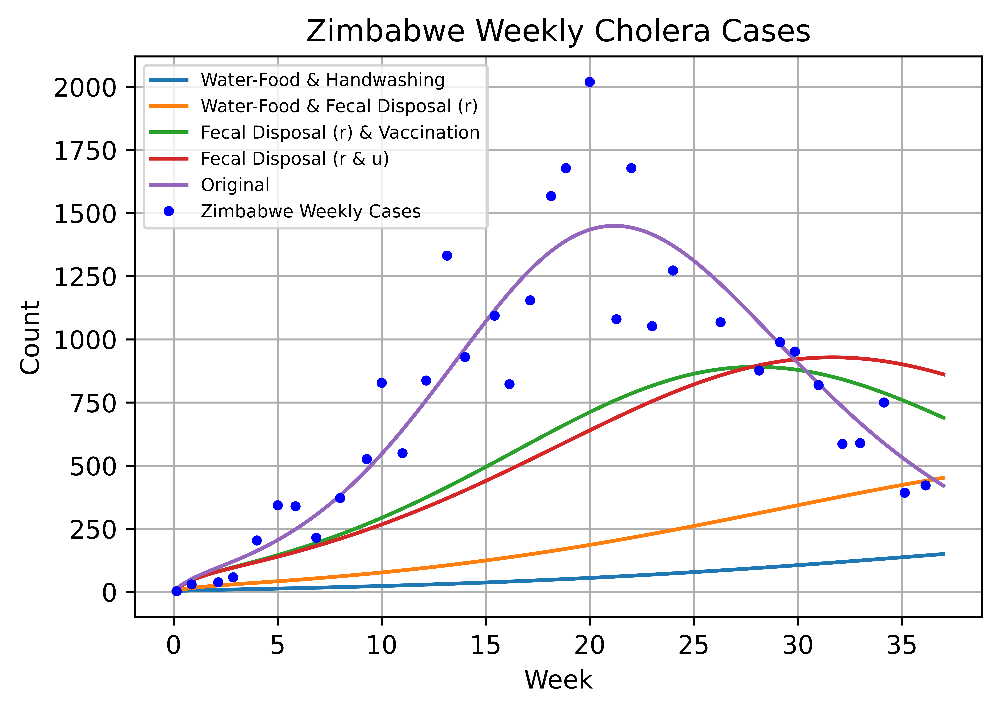

In [ ]:
BestFit2 = BestFit.values.flatten().tolist()
a = BestFit2[1]
lamb = BestFit2[2]
sigma = BestFit2[3]
ratio = BestFit2[4]
q_A = q_I/ratio

A0 = I0*(1-sigma)/sigma
S0 = 1-I0-A0

print('a=', a)
print('lambda=', lamb)
print('sigma=', sigma)
print('ratio=', ratio)
print('q_A=', q_A)


# fit = Cholera_fitter(Cholera_model, t, a, thresh, lamb, c_s, c_h, c_f_I, c_f_A, sigma, mu, nu, p_I, p_A, q_I, q_A, r, data_zimb, 'Zimbabwe', pop, 0)
# fit

figure(1, [6, 4], dpi=600)
plt.grid()
plt.title('Zimbabwe Weekly Cholera Cases')
for i in range(len(Compliance)):
      c_s = Compliance['c_s'][i]
      c_h = Compliance['c_h'][i]
      c_f_I = Compliance['c_f_I'][i]
      c_f_A = Compliance['c_f_A'][i]
      nu = Compliance['nu'][i]
      title = Compliance['Case'][i]
      output_fit = Cholera_solver(Cholera_model, t, a, thresh, lamb, c_s, c_h, c_f_I, c_f_A, sigma, mu, nu, p_I, p_A, q_I, q_A, r, pop)
      plt.plot(output_fit['time'], output_fit['I(t)'], '-', label=title)
plt.plot(data_zimb['Day_new']/7, data_zimb['Zimbabwe'], 'b.', label='Zimbabwe Weekly Cases')
plt.xlabel('Week')
plt.ylabel('Count')
plt.legend(prop={'size': 7})

In [ ]:
data_zimb_cumul = pd.read_csv(path_to_data + "Zimb_cumul.csv", sep=",", header=0)

data_zimb['Cumul'] = data_zimb_cumul['Zimb_cumul']
data_zimb

,Date,Day,Zimbabwe,Day_new,Cumul
0,1,241,3.0,1,3
1,1,246,30.0,6,33
2,3,255,38.0,15,71
3,3,260,58.0,20,129
4,5,268,204.0,28,333
5,6,275,343.0,35,676
6,6,281,339.0,41,1015
7,7,288,215.0,48,1230
8,9,296,372.0,56,1602
9,10,305,526.0,65,2128


16855806.293005418


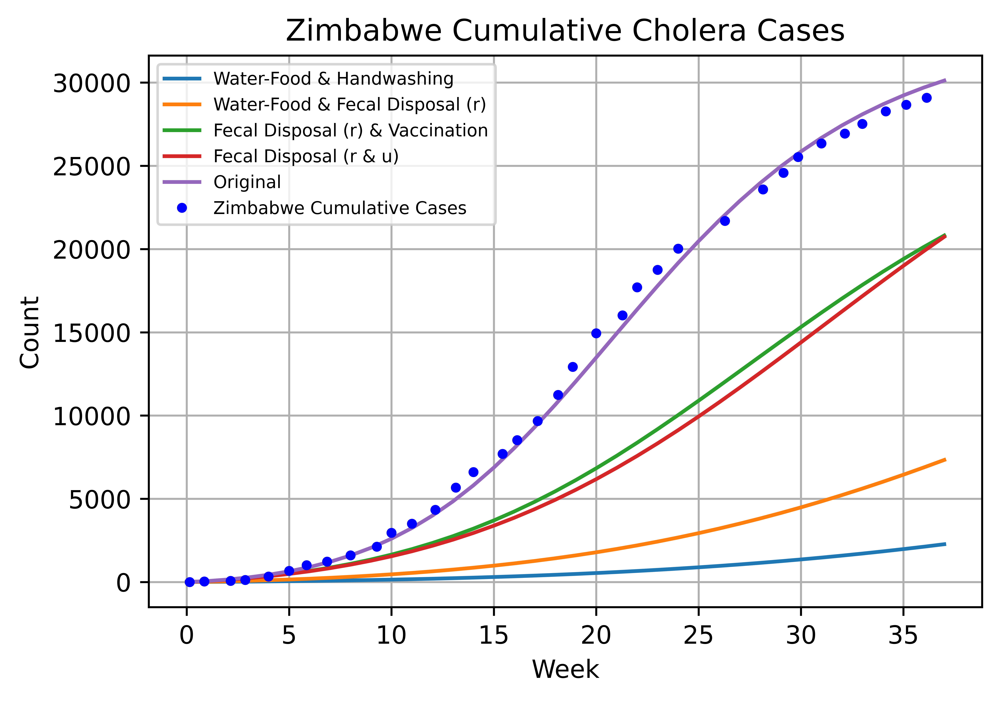

In [ ]:
burnin = 0

Sum = Cholera_fitter_cumul(Cholera_model, t, a, thresh, lamb, c_s, c_h, c_f_I, c_f_A, sigma, mu, nu, p_I, p_A, q_I, q_A, r, data_zimb, 'Cumul', pop, burnin)
print(Sum)

# cumul_fit = Cholera_solver_cumul(Cholera_model, t, a, thresh, lamb, c_s, c_h, c_f_I, c_f_A, sigma, mu, nu, p_I, p_A, q_I, q_A, r, data_zimb, 'Cumul', pop, burnin)


figure(1, [6, 4], dpi=600)
plt.grid()
plt.title('Zimbabwe Cumulative Cholera Cases')
for i in range(len(Compliance)):
      c_s = Compliance['c_s'][i]
      c_h = Compliance['c_h'][i]
      c_f_I = Compliance['c_f_I'][i]
      c_f_A = Compliance['c_f_A'][i]
      nu = Compliance['nu'][i]
      title = Compliance['Case'][i]
      output_fit = cumul_fit = Cholera_solver_cumul(Cholera_model, t, a, thresh, lamb, c_s, c_h, c_f_I, c_f_A, sigma, mu, nu, p_I, p_A, q_I, q_A, r, data_zimb, 'Cumul', pop, burnin)
      plt.plot(cumul_fit['time'], cumul_fit['I(t)_cumul'], '-', label=title)
plt.plot(data_zimb['Day_new']/7+burnin, data_zimb['Cumul'], 'b.', label='Zimbabwe Cumulative Cases')
plt.xlabel('Week')
plt.ylabel('Count')
plt.legend(prop={'size': 7})

## Haiti (PNAS):

In [ ]:
data_haiti_1 = data_haiti_1.drop(columns=['PNAS (M)', 'PAHO', 'PAHO_Sum'])

data_haiti_1

,Date,PNAS
0,1,12000
1,2,7800
2,3,15600
3,4,15050
4,5,15300
5,6,14750
6,7,15500
7,8,20200
8,9,19500
9,10,24100


In [ ]:
Life_expect = 62.5
pop = 3500000

# a_vals = np.linspace(0.45, 0.49, 5)
# lamb_vals = np.linspace(3.41, 3.61, 6)
# sigma_vals = np.linspace(0.09, 0.094, 5)
# ratio_vals = np.linspace(21.25, 22.25, 5)
# burnin_vals = np.linspace(8, 10, 3, dtype=int)


a_vals = np.linspace(0.40, 0.50, 6)
lamb_vals = np.linspace(3.25, 3.45, 6)
sigma_vals = np.linspace(0.09, 0.094, 5)
ratio_vals = np.linspace(19.75, 20.75, 5)
burnin_vals = np.linspace(8, 10, 3, dtype=int)



mu = 1/(Life_expect*52.1)
p_A = 1.
p_I = 1.

## Compliance levels:
c_s = 0.    ## Sanitary Disposal Compliance
c_h = 0.    ## Handwashing compliance
c_f_A = 0.    ## Fecal disposal compliance for asymptomatic
c_f_I = 0.    ## Fecal disposal compliance for symptomatic
nu = 0.      ## Vaccination Rate


K=600000
thresh =10000/K

r= 0.23 #0.3
q_I = 9. #5.

dt=0.1  #0.01
max_time = 36
t = np.linspace(0,max_time,int(max_time/dt)+1)

pop = 3500000
I0 = 1/pop
# S0 = (pop-I0)/pop
# A0 = I0*(1-sigma)/sigma
B0=12000/K


print('a_vals=', a_vals)
print('lamb_vals=', lamb_vals)
print('sigma_vals=', sigma_vals)
print('mu_vals=', mu)
print('p_A_vals=', p_A)
print('p_I_vals=', p_I)
print('ratio_vals=', ratio_vals)
print('burnin_vals=', burnin_vals)
print('----------------------')

SumSq = []
Aval = []
Lambda = []
Sigma = []
Ratio = []
Burnin = []


for a in a_vals:
  for lamb in lamb_vals:
    for sigma in sigma_vals:
      for burnin in burnin_vals:
        for ratio in ratio_vals:
          A0 = I0*(1-sigma)/sigma
          S0 = 1-I0-A0
          q_A = q_I/ratio
          Aval.append(a)
          Lambda.append(lamb)
          Sigma.append(sigma)
          Ratio.append(ratio)
          Burnin.append(burnin)
          fit = Cholera_fitter(Cholera_model, t, a, thresh, lamb, c_s, c_h, c_f_I, c_f_A, sigma, mu, nu, p_I, p_A, q_I, q_A, r, data_haiti_1, 'PNAS', pop, burnin)
          SumSq.append(fit)

ParamFit = pd.DataFrame()
ParamFit['SumSq'] = SumSq
ParamFit['Aval'] = Aval
ParamFit['Lambda'] = Lambda
ParamFit['Sigma'] = Sigma
ParamFit['Ratio'] = Ratio
ParamFit['Burnin'] = Burnin

BestFit = pd.DataFrame()
BestFit = ParamFit.loc[ParamFit['SumSq']==ParamFit['SumSq'].min()] #.reset_index(drop=True)

print(BestFit)

a_vals= [0.4  0.42 0.44 0.46 0.48 0.5 ]
lamb_vals= [3.25 3.29 3.33 3.37 3.41 3.45]
sigma_vals= [0.09  0.091 0.092 0.093 0.094]
mu_vals= 0.0003071017274472169
p_A_vals= 1.0
p_I_vals= 1.0
ratio_vals= [19.75 20.   20.25 20.5  20.75]
burnin_vals= [ 8  9 10]
----------------------
             SumSq  Aval  Lambda  Sigma  Ratio  Burnin
1087  1.913889e+08  0.44    3.33  0.092  20.25       9


a= 0.44
lambda= 3.33
sigma= 0.092
ratio= 20.25
q_A= 0.4444444444444444


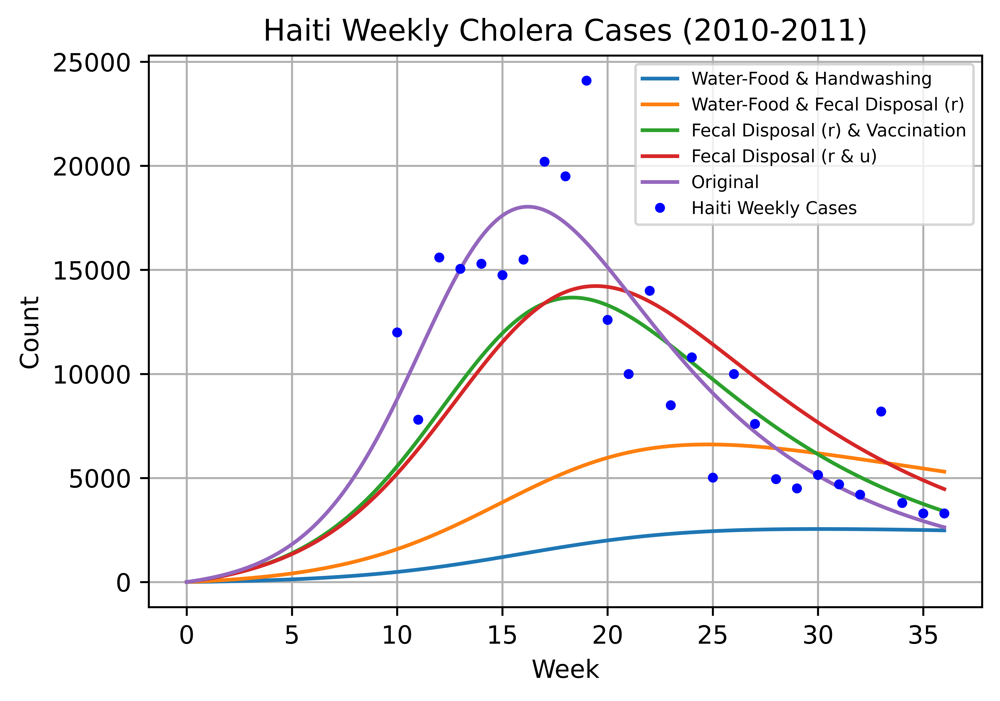

In [ ]:
BestFit2 = BestFit.iloc[0, :].values.flatten().tolist()

pop = 3500000

# a= 0.7
# lamb = 2.
# sigma=0.1
# ratio = 25
# q_I = 9
a = BestFit2[1]
lamb = BestFit2[2]
sigma = BestFit2[3]
ratio = BestFit2[4]
burnin = BestFit2[5]
q_A = q_I/ratio

print('a=', a)
print('lambda=', lamb)
print('sigma=', sigma)
print('ratio=', ratio)
print('q_A=', q_A)


# fit = Cholera_fitter(Cholera_model, t, a, thresh, lamb, c_s, c_h, c_f_I, c_f_A, sigma, mu, nu, p_I, p_A, q_I, q_A, r, data_haiti_1, 'PNAS', pop, burnin)
# fit
# output_fit = Cholera_solver(Cholera_model, t, a, thresh, lamb, c_s, c_h, c_f_I, c_f_A, sigma, mu, nu, p_I, p_A, q_I, q_A, r, pop)

plt.figure(1, [6, 4], dpi=600)
plt.grid()
plt.title('Haiti Weekly Cholera Cases (2010-2011)')
for i in range(len(Compliance)):
      c_s = Compliance['c_s'][i]
      c_h = Compliance['c_h'][i]
      c_f_I = Compliance['c_f_I'][i]
      c_f_A = Compliance['c_f_A'][i]
      nu = Compliance['nu'][i]
      title = Compliance['Case'][i]
      output_fit = Cholera_solver(Cholera_model, t, a, thresh, lamb, c_s, c_h, c_f_I, c_f_A, sigma, mu, nu, p_I, p_A, q_I, q_A, r, pop)
      plt.plot(output_fit['time'], output_fit['I(t)'], '-', label=title)
plt.plot(data_haiti_1['Date']+burnin, data_haiti_1['PNAS'], 'b.', label='Haiti Weekly Cases')
plt.xlabel('Week')
plt.ylabel('Count')
plt.legend(prop={'size': 7})

13437904181.708448


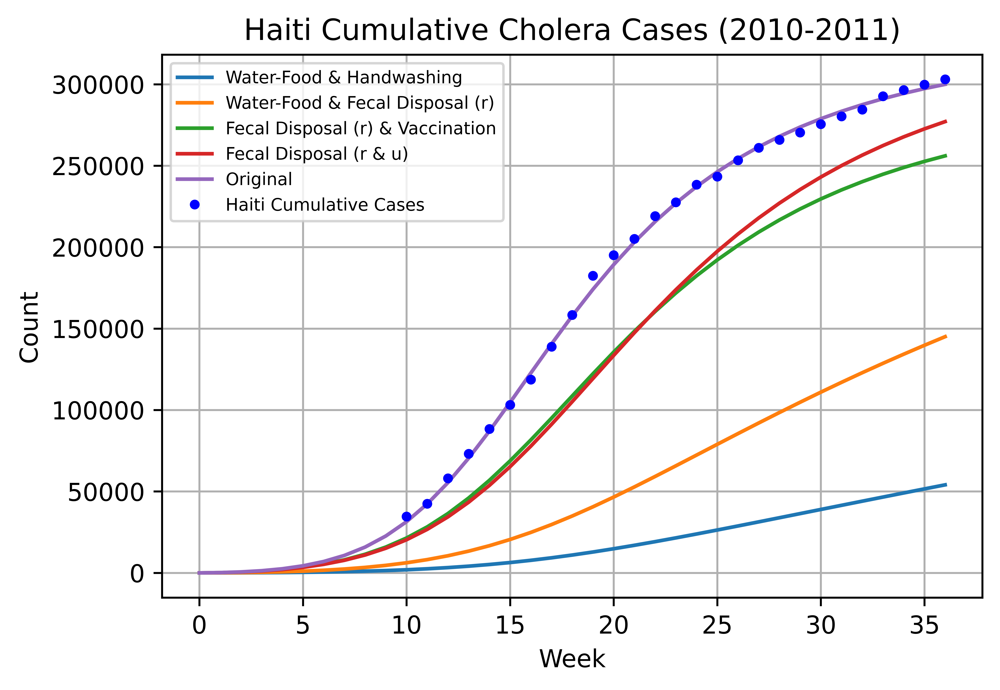

In [ ]:
data_haiti_1['Cumul'] = np.cumsum(data_haiti_1['PNAS'])
data_haiti_1

Sum = Cholera_fitter_cumul(Cholera_model, t, a, thresh, lamb, c_s, c_h, c_f_I, c_f_A, sigma, mu, nu, p_I, p_A, q_I, q_A, r, data_haiti_1, 'Cumul', pop, burnin)
print(Sum)

cumul_fit = Cholera_solver_cumul(Cholera_model, t, a, thresh, lamb, c_s, c_h, c_f_I, c_f_A, sigma, mu, nu, p_I, p_A, q_I, q_A, r, data_haiti_1, 'Cumul', pop, burnin)


plt.figure(1, [6, 4], dpi=600)
plt.grid()
plt.title('Haiti Cumulative Cholera Cases (2010-2011)')
for i in range(len(Compliance)):
      c_s = Compliance['c_s'][i]
      c_h = Compliance['c_h'][i]
      c_f_I = Compliance['c_f_I'][i]
      c_f_A = Compliance['c_f_A'][i]
      nu = Compliance['nu'][i]
      title = Compliance['Case'][i]
      cumul_fit = Cholera_solver_cumul(Cholera_model, t, a, thresh, lamb, c_s, c_h, c_f_I, c_f_A, sigma, mu, nu, p_I, p_A, q_I, q_A, r, data_haiti_1, 'Cumul', pop, burnin)
      plt.plot(cumul_fit['time'], cumul_fit['I(t)_cumul'], '-', label=title)
plt.plot(data_haiti_1['Date']+burnin, data_haiti_1['Cumul']+cumul_fit['I(t)_cumul'][burnin], 'b.', label='Haiti Cumulative Cases')
plt.xlabel('Week')
plt.ylabel('Count')
plt.legend(prop={'size': 7})

## Haiti (PAHO):

,Date,PAHO_Sum
0,1.0,158.0
1,2.0,1089.0
2,3.0,1177.0
3,4.0,1706.0
4,5.0,2611.0
5,6.0,2753.0
6,7.0,2648.0
7,8.0,2543.0
8,9.0,2457.0
9,10.0,2087.0


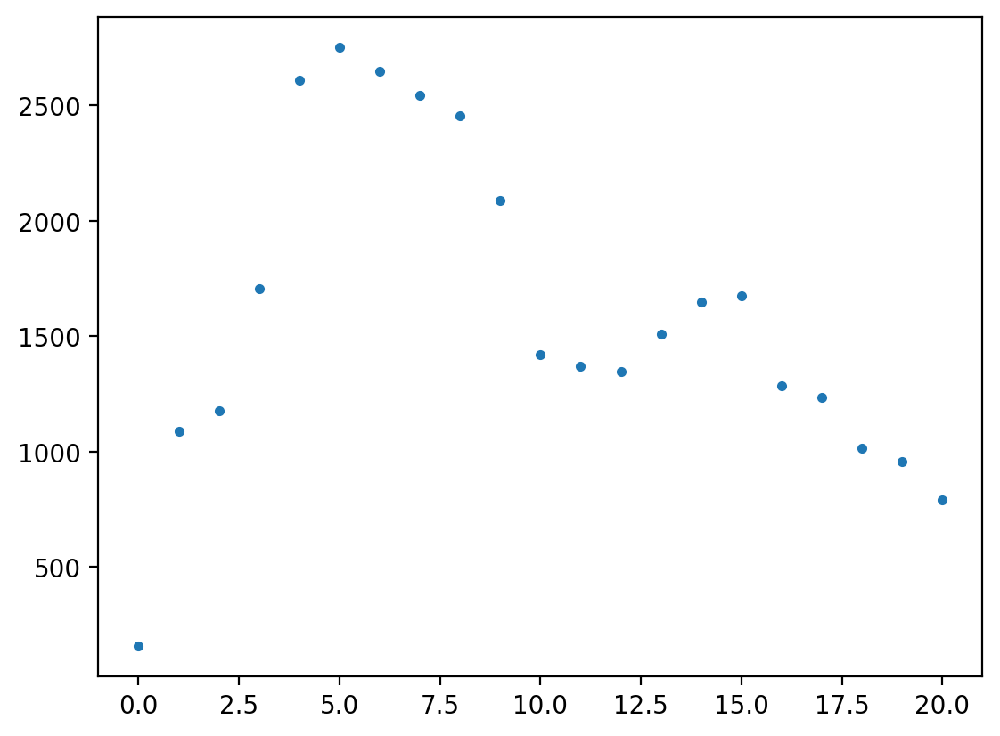

In [ ]:
plt.plot(data_haiti_2['PAHO_Sum'],'.')

data_haiti_2

In [ ]:
Life_expect = 62.5
pop = 450000

a = 0.4
lamb_vals = np.linspace(4., 4.6, 7)
sigma_vals = np.linspace(0.104, 0.114, 6)
ratio_vals = np.linspace(45.125, 45.625, 5)
# burnin_vals = np.linspace(6, 9, 4, dtype=int)
chol_vals = np.linspace(70000, 110000, 5)
q_I_vals = np.linspace(9.,17.,9)

# a_vals = np.linspace(0.4, 0.6, 3)

# a = 0.4
# lamb_vals = np.linspace(4.4, 5.2, 9)
# sigma_vals = np.linspace(0.105, 0.115, 3)
# ratio_vals = np.linspace(27., 33., 7)
# # burnin_vals = np.linspace(6, 9, 4, dtype=int)
# chol_vals = np.linspace(70000, 110000, 5)

# a = 0.4
# lamb_vals = np.linspace(0.30, 0.40, 9)
# sigma_vals = np.linspace(0.08, 0.10, 5)
# ratio_vals = np.linspace(20., 22., 5)
# # burnin_vals = np.linspace(6, 9, 4, dtype=int)
# chol_vals = np.linspace(34000, 40000, 5)
# q_I_vals = np.linspace(17.,25.,9)


burnin = -1

mu = 1/(Life_expect*52.1)
p_A = 1.5
p_I = 1.1

## Compliance levels:
c_s = 0.    ## Sanitary Disposal Compliance
c_h = 0.    ## Handwashing compliance
c_f_A = 0.    ## Fecal disposal compliance for asymptomatic
c_f_I = 0.    ## Fecal disposal compliance for symptomatic
nu = 0.      ## Vaccination Rate


K=600000
thresh =10000/K
r=1.
# q_I = 7.2


dt=0.1  #0.01
max_time = 21
t = np.linspace(0,max_time,int(max_time/dt)+1)


I0 = 158/pop
# S0 = (pop-I0)/pop
# A0 = I0*(1-sigma)/sigma
# B0=50000/K


# print('a_vals=', a_vals)
print('q_I_vals=', q_I_vals)
print('lamb_vals=', lamb_vals)
print('sigma_vals=', sigma_vals)
print('mu_vals=', mu)
print('p_A_vals=', p_A)
print('p_I_vals=', p_I)
print('ratio_vals=', ratio_vals)
# print('burnin_vals=', burnin_vals)
print('Chol_vals=', chol_vals)
print('----------------------')

SumSq = []
Aval = []
QI_val = []
Lambda = []
Sigma = []
Ratio = []
# Burnin = []
Chol = []


# for a in a_vals:
for q_I in q_I_vals:
  for lamb in lamb_vals:
    for sigma in sigma_vals:
      # for burnin in burnin_vals:
      for chol in chol_vals:
        for ratio in ratio_vals:
          B0=chol/K
          A0 = I0*(1-sigma)/sigma
          S0 = 1-I0-A0
          q_A = q_I/ratio
          # Aval.append(a)
          QI_val.append(q_I)
          Lambda.append(lamb)
          Sigma.append(sigma)
          Ratio.append(ratio)
          # Burnin.append(burnin)
          Chol.append(chol)
          fit = Cholera_fitter(Cholera_model, t, a, thresh, lamb, c_s, c_h, c_f_I, c_f_A, sigma, mu, nu, p_I, p_A, q_I, q_A, r, data_haiti_2, 'PAHO_Sum', pop, burnin)
          SumSq.append(fit)

ParamFit = pd.DataFrame()
ParamFit['SumSq'] = SumSq
# ParamFit['Aval'] = Aval
ParamFit['QI_val'] = QI_val
ParamFit['Lambda'] = Lambda
ParamFit['Sigma'] = Sigma
ParamFit['Ratio'] = Ratio
# ParamFit['Burnin'] = Burnin
ParamFit['Chol'] = Chol
# ParamFit['Aval'] = Aval

BestFit = pd.DataFrame()
BestFit = ParamFit.loc[ParamFit['SumSq']==ParamFit['SumSq'].min()] #.reset_index(drop=True)

print(BestFit)

q_I_vals= [ 9. 10. 11. 12. 13. 14. 15. 16. 17.]
lamb_vals= [4.  4.1 4.2 4.3 4.4 4.5 4.6]
sigma_vals= [0.104 0.106 0.108 0.11  0.112 0.114]
mu_vals= 0.0003071017274472169
p_A_vals= 1.5
p_I_vals= 1.1
ratio_vals= [45.125 45.25  45.375 45.5   45.625]
Chol_vals= [ 70000.  80000.  90000. 100000. 110000.]
----------------------
             SumSq  QI_val  Lambda  Sigma   Ratio     Chol
3662  1.199557e+06    12.0     4.3  0.108  45.375  90000.0


a= 0.4
q_I= 12.0
lambda= 4.3
sigma= 0.108
ratio= 45.375
q_A= 0.2644628099173554
1199550.0744838128


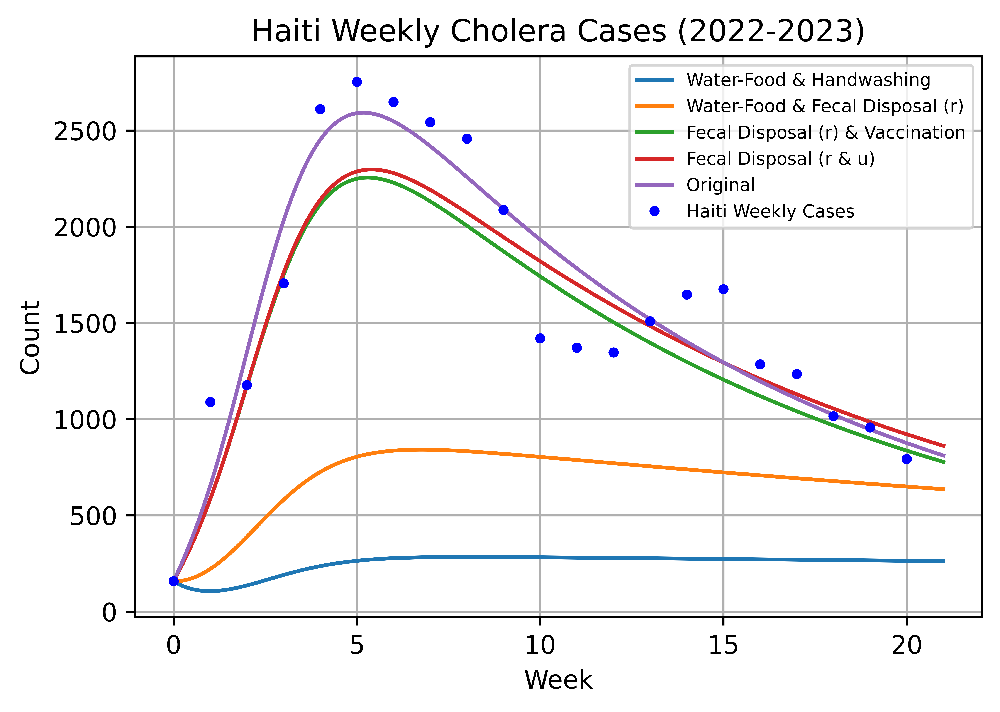

In [ ]:
BestFit2 = BestFit.iloc[0, :].values.flatten().tolist()

# pop = 600000
# p_I = 1.

q_I = BestFit2[1]
# a = BestFit2[1]
lamb = BestFit2[2]
sigma = BestFit2[3]
ratio = BestFit2[4]
# burnin = BestFit2[5]
chol = BestFit2[5]
# a = BestFit2[6]
B0=chol/K


# q_I = 18
q_A = q_I/ratio

print('a=', a)
print('q_I=', q_I)
print('lambda=', lamb)
print('sigma=', sigma)
print('ratio=', ratio)
print('q_A=', q_A)


fit = Cholera_fitter(Cholera_model, t, a, thresh, lamb, c_s, c_h, c_f_I, c_f_A, sigma, mu, nu, p_I, p_A, q_I, q_A, r, data_haiti_2, 'PAHO_Sum', pop, burnin)
print(fit)
output_fit = Cholera_solver(Cholera_model, t, a, thresh, lamb, c_s, c_h, c_f_I, c_f_A, sigma, mu, nu, p_I, p_A, q_I, q_A, r, pop)


plt.figure(1, [6, 4], dpi=600)
plt.grid()
plt.title('Haiti Weekly Cholera Cases (2022-2023)')
for i in range(len(Compliance)):
      c_s = Compliance['c_s'][i]
      c_h = Compliance['c_h'][i]
      c_f_I = Compliance['c_f_I'][i]
      c_f_A = Compliance['c_f_A'][i]
      nu = Compliance['nu'][i]
      title = Compliance['Case'][i]
      output_fit = Cholera_solver(Cholera_model, t, a, thresh, lamb, c_s, c_h, c_f_I, c_f_A, sigma, mu, nu, p_I, p_A, q_I, q_A, r, pop)
      plt.plot(output_fit['time'], output_fit['I(t)'], '-', label=title)
plt.plot(data_haiti_2['Date']+burnin, data_haiti_2['PAHO_Sum'], 'b.', label='Haiti Weekly Cases')
plt.xlabel('Week')
plt.ylabel('Count')
plt.legend(prop={'size': 7})

In [ ]:
data_haiti_2['Cumul'] = np.cumsum(data_haiti_2['PAHO_Sum'])
data_haiti_2

,Date,PAHO_Sum,Cumul
0,1.0,158.0,158.0
1,2.0,1089.0,1247.0
2,3.0,1177.0,2424.0
3,4.0,1706.0,4130.0
4,5.0,2611.0,6741.0
5,6.0,2753.0,9494.0
6,7.0,2648.0,12142.0
7,8.0,2543.0,14685.0
8,9.0,2457.0,17142.0
9,10.0,2087.0,19229.0


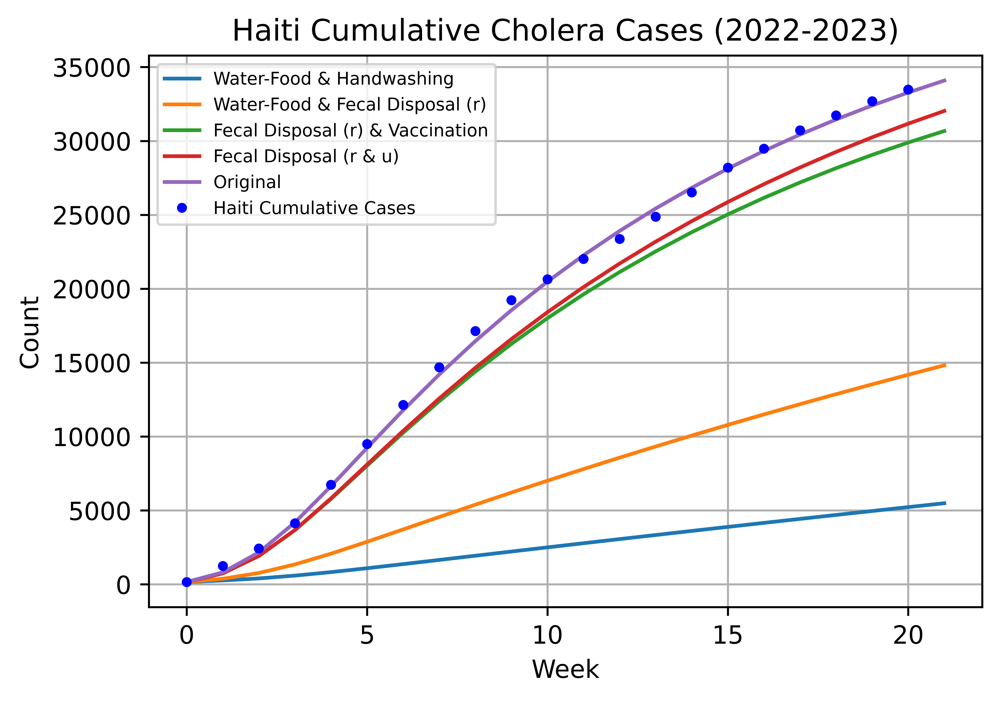

In [ ]:
# Sum = Cholera_fitter_cumul(Cholera_model, t, a, thresh, lamb, c_s, c_h, c_f_I, c_f_A, sigma, mu, nu, p_I, p_A, q_I, q_A, r, data_haiti_2, 'Cumul', pop, burnin)
# print(Sum)

# cumul_fit = Cholera_solver_cumul(Cholera_model, t, a, thresh, lamb, c_s, c_h, c_f_I, c_f_A, sigma, mu, nu, p_I, p_A, q_I, q_A, r, data_haiti_2, 'Cumul', pop, burnin)


plt.figure(1, [6, 4], dpi=600)
plt.grid()
plt.title('Haiti Cumulative Cholera Cases (2022-2023)')
for i in range(len(Compliance)):
      c_s = Compliance['c_s'][i]
      c_h = Compliance['c_h'][i]
      c_f_I = Compliance['c_f_I'][i]
      c_f_A = Compliance['c_f_A'][i]
      nu = Compliance['nu'][i]
      title = Compliance['Case'][i]
      cumul_fit = Cholera_solver_cumul(Cholera_model, t, a, thresh, lamb, c_s, c_h, c_f_I, c_f_A, sigma, mu, nu, p_I, p_A, q_I, q_A, r, data_haiti_2, 'Cumul', pop, burnin)
      plt.plot(cumul_fit['time'], cumul_fit['I(t)_cumul'], '-', label=title)
plt.plot(data_haiti_2['Date']+burnin, data_haiti_2['Cumul'], 'b.', label='Haiti Cumulative Cases')
plt.xlabel('Week')
plt.ylabel('Count')
plt.legend(prop={'size': 7})

##Kenya:

In [ ]:
data_kenya = data_all[['Date', 'Day', 'Kenya']].iloc[:35, :]
data_kenya['Date'] = data_kenya['Day']//7+1
data_kenya = data_kenya[data_kenya['Kenya'].notnull()]

data_kenya = data_kenya.reset_index(drop=True)
data_kenya


# plt.plot(data_kenya['Date'], data_kenya['Kenya'], 'm.')

,Date,Day,Kenya
0,1,1,347.0
1,3,16,633.0
2,4,22,356.0
3,5,29,205.0
4,6,37,249.0
5,7,43,205.0
6,8,51,628.0
7,9,58,467.0
8,10,65,451.0
9,12,80,1129.0


In [ ]:
Life_expect = 66.8
pop = 100000


a_vals = np.linspace(1.4, 2.2, 5)
lamb_vals = np.linspace(3.6, 4., 5)
sigma_vals = np.linspace(0.1125, 0.1175, 5)
ratio_vals = np.linspace(48., 49., 5)
burnin_vals = np.linspace(10, 12, 3, dtype=int)
bact_vals = np.linspace(10000, 10000, 1)



mu = 1/(Life_expect*52.1)
p_A = 1.
p_I = 0.95

## Compliance levels:
c_s = 0.    ## Sanitary Disposal Compliance
c_h = 0.    ## Handwashing compliance
c_f_A = 0.    ## Fecal disposal compliance for asymptomatic
c_f_I = 0.    ## Fecal disposal compliance for symptomatic
nu = 0.      ## Vaccination Rate


# K=60000
# thresh =1000/K
# B0 = 1500/K

K = 300000
thresh = 10000/K
# B0 = 20000/K

r=0.07
q_I = 1. # 9

# q_I_vals = np.linspace(1., 1., 1) #(0.5, 1.5, 3)

dt=0.1  #0.01
max_time = 55
t = np.linspace(0,max_time,int(max_time/dt)+1)


I0 = 1/pop



print('a_vals=', a_vals)
print('lamb_vals=', lamb_vals)
print('sigma_vals=', sigma_vals)
print('mu_vals=', mu)
print('p_A_vals=', p_A)
print('p_I_vals=', p_I)
print('ratio_vals=', ratio_vals)
print('burnin_vals=', burnin_vals)
print('----------------------')

SumSq = []
Aval = []
Lambda = []
Sigma = []
Ratio = []
Burnin = []
Bact = []

# for q_I in q_I_vals:
for bact in bact_vals:
  for a in a_vals:
    for lamb in lamb_vals:
      for sigma in sigma_vals:
        for burnin in burnin_vals:
          for ratio in ratio_vals:
            B0 = bact/K
            A0 = I0*(1-sigma)/sigma
            S0 = 1-I0-A0
            q_A = q_I/ratio
            Aval.append(a)
            Lambda.append(lamb)
            Sigma.append(sigma)
            Ratio.append(ratio)
            Burnin.append(burnin)
            Bact.append(bact)
            fit = Cholera_fitter(Cholera_model, t, a, thresh, lamb, c_s, c_h, c_f_I, c_f_A, sigma, mu, nu, p_I, p_A, q_I, q_A, r, data_kenya, 'Kenya', pop, burnin)
            SumSq.append(fit)

ParamFit = pd.DataFrame()
ParamFit['SumSq'] = SumSq
ParamFit['Aval'] = Aval
ParamFit['Lambda'] = Lambda
ParamFit['Sigma'] = Sigma
ParamFit['Ratio'] = Ratio
ParamFit['Burnin'] = Burnin
ParamFit['Bact'] = Bact

BestFit = pd.DataFrame()
BestFit = ParamFit.loc[ParamFit['SumSq']==ParamFit['SumSq'].min()] #.reset_index(drop=True)

print(BestFit)

a_vals= [1.4 1.6 1.8 2.  2.2]
lamb_vals= [3.6 3.7 3.8 3.9 4. ]
sigma_vals= [0.1125  0.11375 0.115   0.11625 0.1175 ]
mu_vals= 0.0002873332030756146
p_A_vals= 1.0
p_I_vals= 0.95
ratio_vals= [48.   48.25 48.5  48.75 49.  ]
burnin_vals= [10 11 12]
----------------------
            SumSq  Aval  Lambda  Sigma  Ratio  Burnin     Bact
937  1.119337e+06   1.8     3.8  0.115   48.5      11  10000.0


a= 1.8
lambda= 3.8
sigma= 0.11499999999999999
ratio= 48.5
q_A= 0.020618556701030927
burnin =  11.0
1119337.23763209


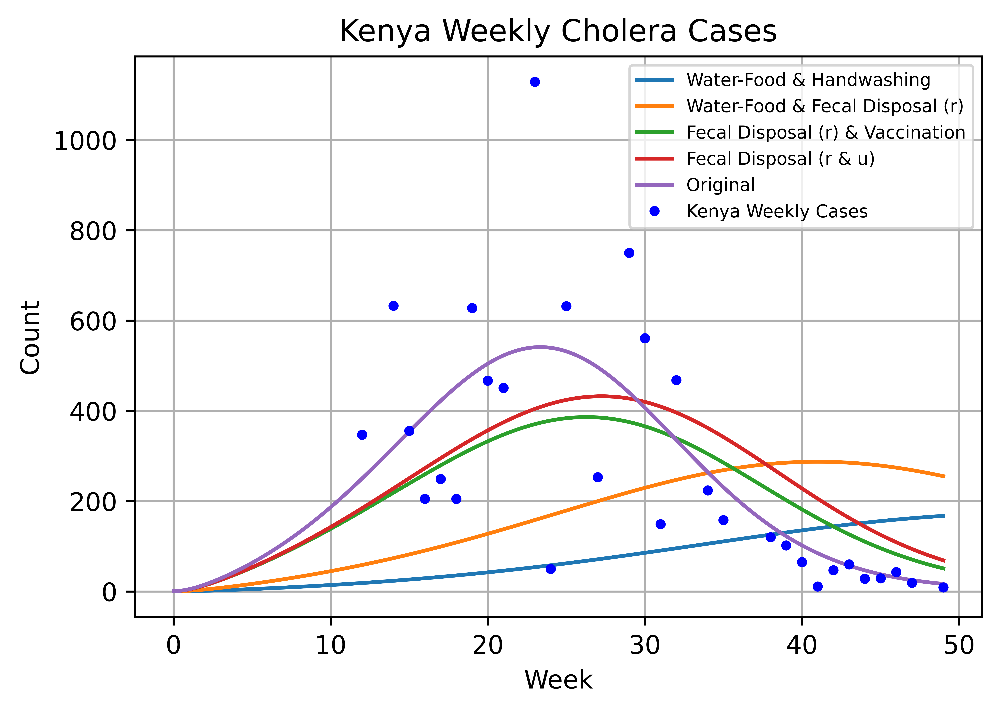

In [ ]:
BestFit2 = BestFit.iloc[0, :].values.flatten().tolist()

# pop = 3500000


a = BestFit2[1]
lamb = BestFit2[2]
sigma = BestFit2[3]
ratio = BestFit2[4]
burnin = BestFit2[5]
bact = BestFit2[6]
B0 = bact/K
q_A = q_I/ratio

print('a=', a)
print('lambda=', lamb)
print('sigma=', sigma)
print('ratio=', ratio)
print('q_A=', q_A)
print('burnin = ', burnin)

t = np.linspace(0,max(data_kenya['Date'])+burnin,int((max(data_kenya['Date'])+burnin)/dt)+1)

fit = Cholera_fitter(Cholera_model, t, a, thresh, lamb, c_s, c_h, c_f_I, c_f_A, sigma, mu, nu, p_I, p_A, q_I, q_A, r, data_kenya, 'Kenya', pop, burnin)
print(fit)
output_fit = Cholera_solver(Cholera_model, t, a, thresh, lamb, c_s, c_h, c_f_I, c_f_A, sigma, mu, nu, p_I, p_A, q_I, q_A, r, pop)


plt.figure(1, [6, 4], dpi=600)
plt.grid()
plt.title('Kenya Weekly Cholera Cases')
for i in range(len(Compliance)):
      c_s = Compliance['c_s'][i]
      c_h = Compliance['c_h'][i]
      c_f_I = Compliance['c_f_I'][i]
      c_f_A = Compliance['c_f_A'][i]
      nu = Compliance['nu'][i]
      title = Compliance['Case'][i]
      output_fit = Cholera_solver(Cholera_model, t, a, thresh, lamb, c_s, c_h, c_f_I, c_f_A, sigma, mu, nu, p_I, p_A, q_I, q_A, r, pop)
      plt.plot(output_fit['time'], output_fit['I(t)'], '-', label=title)
plt.plot(data_kenya['Date']+burnin, data_kenya['Kenya'], 'b.', label='Kenya Weekly Cases')
plt.xlabel('Week')
plt.ylabel('Count')
plt.legend(prop={'size': 7})

In [ ]:
data_kenya_cumul = pd.read_csv(path_to_data + "data_kenya_cumul.csv", sep=",", header=0)

data_kenya_cumul = data_kenya_cumul[data_kenya_cumul['Date']<=36]

# data_kenya_cumul = data_kenya
# data_kenya_cumul['Cumul'] = np.cumsum(data_kenya['Kenya'])

data_kenya_cumul

,Date,Day,Kenya,Cumul
0,1,1,347.000000,347.00000
1,2,Missing,490.000000,837.00000
2,3,16,633.000000,1470.00000
3,4,22,356.000000,1826.00000
4,5,29,205.000000,2031.00000
5,6,37,249.000000,2280.00000
6,7,43,205.000000,2485.00000
7,8,51,628.000000,3113.00000
8,9,58,467.000000,3580.00000
9,10,65,451.000000,4031.00000


33572602.300909534


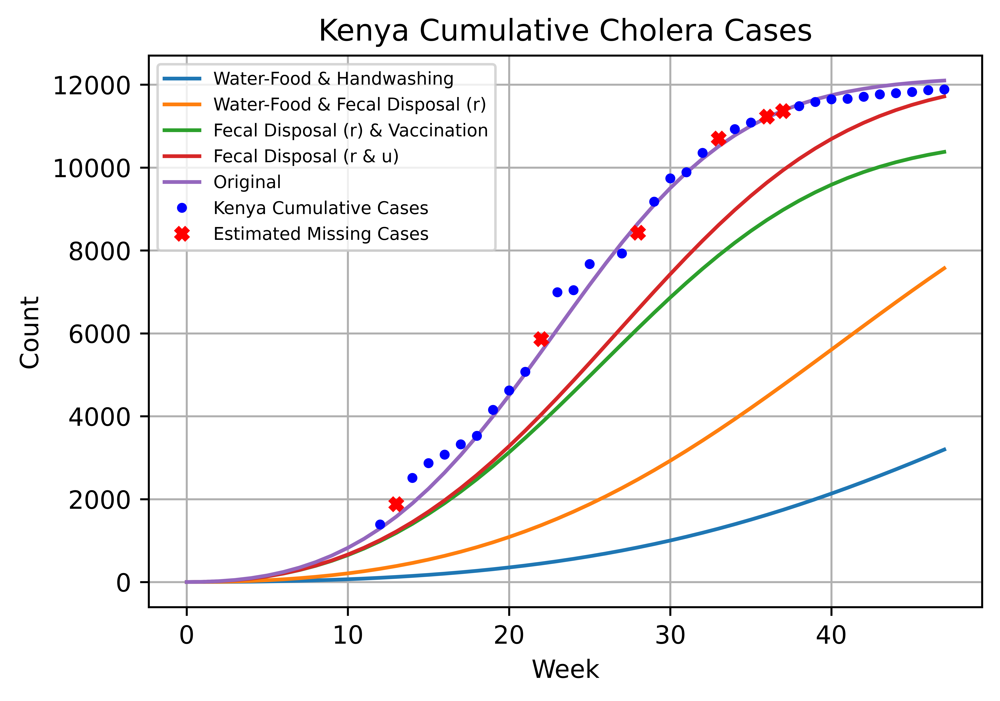

In [ ]:
t = np.linspace(0,max(data_kenya_cumul['Date'])+burnin,int((max(data_kenya_cumul['Date'])+burnin)/dt)+1)

Sum = Cholera_fitter_cumul(Cholera_model, t, a, thresh, lamb, c_s, c_h, c_f_I, c_f_A, sigma, mu, nu, p_I, p_A, q_I, q_A, r, data_kenya_cumul, 'Cumul', pop, burnin)
print(Sum)

cumul_fit = Cholera_solver_cumul(Cholera_model, t, a, thresh, lamb, c_s, c_h, c_f_I, c_f_A, sigma, mu, nu, p_I, p_A, q_I, q_A, r, data_kenya_cumul, 'Cumul', pop, burnin)


plt.figure(1, [6, 4], dpi=600)
plt.grid()
plt.title('Kenya Cumulative Cholera Cases')
for i in range(len(Compliance)):
      c_s = Compliance['c_s'][i]
      c_h = Compliance['c_h'][i]
      c_f_I = Compliance['c_f_I'][i]
      c_f_A = Compliance['c_f_A'][i]
      nu = Compliance['nu'][i]
      title = Compliance['Case'][i]
      cumul_fit = Cholera_solver_cumul(Cholera_model, t, a, thresh, lamb, c_s, c_h, c_f_I, c_f_A, sigma, mu, nu, p_I, p_A, q_I, q_A, r, data_kenya, 'Cumul', pop, burnin)
      plt.plot(cumul_fit['time'], cumul_fit['I(t)_cumul'], '-', label=title)
# plt.plot(data_kenya['Date']+burnin, data_kenya['Cumul']+cumul_fit['I(t)_cumul'][burnin], 'b.', label='Kenya Cases')
plt.plot(data_kenya_cumul['Date']+burnin, data_kenya_cumul['Cumul']+cumul_fit['I(t)_cumul'][burnin], 'b.', label='Kenya Cumulative Cases')
plt.plot(data_kenya_cumul['Date'][data_kenya_cumul['Day']=='Missing']+burnin, data_kenya_cumul['Cumul'][data_kenya_cumul['Day']=='Missing']+cumul_fit['I(t)_cumul'][burnin],
         'rX', markersize=5, label='Estimated Missing Cases')
plt.xlabel('Week')
plt.ylabel('Count')
plt.legend(prop={'size': 7})

## Malawi:

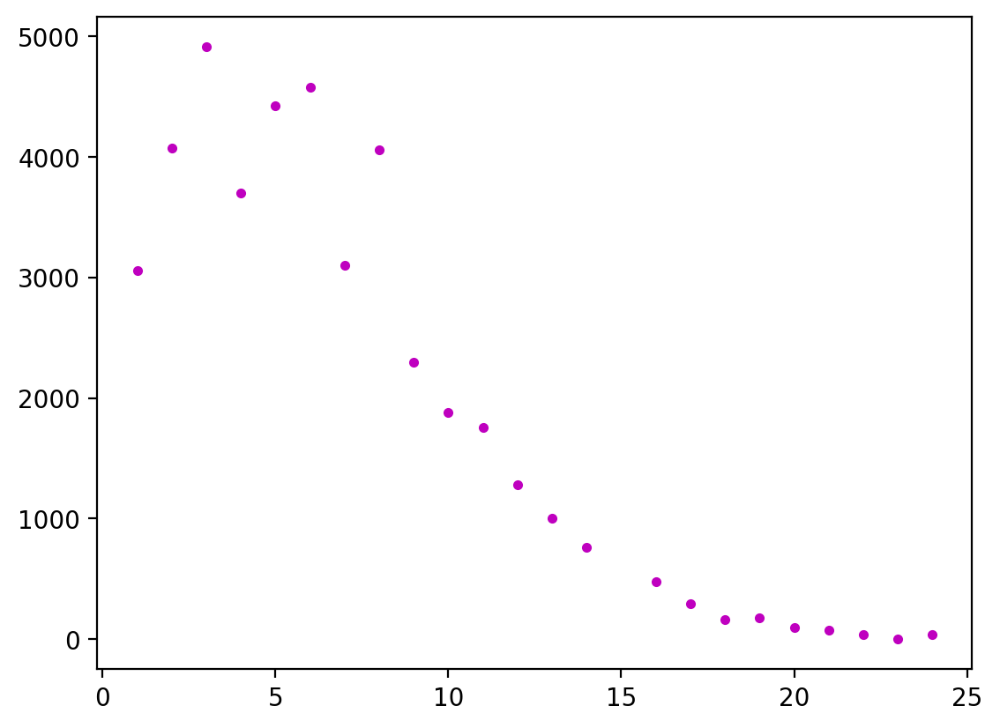

In [ ]:
data_malawi = data_all[['Date', 'Day', 'Malawi']].iloc[:23, :]
data_malawi['Date'] = data_malawi['Day']//7+1
data_malawi


plt.plot(data_malawi['Date'], data_malawi['Malawi'], 'm.')



In [ ]:
Life_expect = 62.5
pop = 450000


# a_vals = np.linspace(4.5, 5.5, 6)
# lamb_vals = np.linspace(12.2, 12.8, 5)
# sigma_vals = np.linspace(0.07, 0.11, 5)
# ratio_vals = np.linspace(37., 41., 5)
# burnin_vals = np.linspace(8, 10, 3, dtype=int)


a_vals = np.linspace(2.6, 3., 5)
lamb_vals = np.linspace(11., 11.4, 5)
sigma_vals = np.linspace(0.0825, 0.0875, 5)
ratio_vals = np.linspace(10., 11., 5)
burnin_vals = np.linspace(9, 11, 3, dtype=int)
bact_vals = np.linspace(24000, 25000, 6)

mu = 1/(Life_expect*52.1)
p_A = 1.
p_I = 0.7

## Compliance levels:
c_s = 0.    ## Sanitary Disposal Compliance
c_h = 0.    ## Handwashing compliance
c_f_A = 0.    ## Fecal disposal compliance for asymptomatic
c_f_I = 0.    ## Fecal disposal compliance for symptomatic
nu = 0.      ## Vaccination Rate


# K=60000
# thresh =1000/K
# B0 = 1500/K

K = 600000
thresh = 10000/K
# B0 = 20000/K

r=0.07
q_I = 7

dt=0.1  #0.01
max_time = 33
t = np.linspace(0,max_time,int(max_time/dt)+1)


I0 = 1/pop

# A0 = I0*(1-sigma)/sigma
# B0=1500/K



print('a_vals=', a_vals)
print('lamb_vals=', lamb_vals)
print('sigma_vals=', sigma_vals)
print('mu_vals=', mu)
print('p_A_vals=', p_A)
print('p_I_vals=', p_I)
print('ratio_vals=', ratio_vals)
print('burnin_vals=', burnin_vals)
print('----------------------')

SumSq = []
Aval = []
Lambda = []
Sigma = []
Ratio = []
Burnin = []
Bact = []

for bact in bact_vals:
  for a in a_vals:
    for lamb in lamb_vals:
      for sigma in sigma_vals:
        for burnin in burnin_vals:
          for ratio in ratio_vals:
            B0 = bact/K
            A0 = I0*(1-sigma)/sigma
            S0 = 1-I0-A0
            q_A = q_I/ratio
            Aval.append(a)
            Lambda.append(lamb)
            Sigma.append(sigma)
            Ratio.append(ratio)
            Burnin.append(burnin)
            Bact.append(bact)
            fit = Cholera_fitter(Cholera_model, t, a, thresh, lamb, c_s, c_h, c_f_I, c_f_A, sigma, mu, nu, p_I, p_A, q_I, q_A, r, data_malawi, 'Malawi', pop, burnin)
            SumSq.append(fit)

ParamFit = pd.DataFrame()
ParamFit['SumSq'] = SumSq
ParamFit['Aval'] = Aval
ParamFit['Lambda'] = Lambda
ParamFit['Sigma'] = Sigma
ParamFit['Ratio'] = Ratio
ParamFit['Burnin'] = Burnin
ParamFit['Bact'] = Bact

BestFit = pd.DataFrame()
BestFit = ParamFit.loc[ParamFit['SumSq']==ParamFit['SumSq'].min()] #.reset_index(drop=True)

print(BestFit)

a_vals= [2.6 2.7 2.8 2.9 3. ]
lamb_vals= [11.  11.1 11.2 11.3 11.4]
sigma_vals= [0.0825  0.08375 0.085   0.08625 0.0875 ]
mu_vals= 0.0003071017274472169
p_A_vals= 1.0
p_I_vals= 0.7
ratio_vals= [10.   10.25 10.5  10.75 11.  ]
burnin_vals= [ 9 10 11]
----------------------
             SumSq  Aval  Lambda    Sigma  Ratio  Burnin     Bact
6992  2.640305e+06   2.9    11.3  0.08375   10.5       9  24600.0


a= 2.9
lambda= 11.3
sigma= 0.08375
ratio= 10.5
q_A= 0.6666666666666666
burnin =  9.0


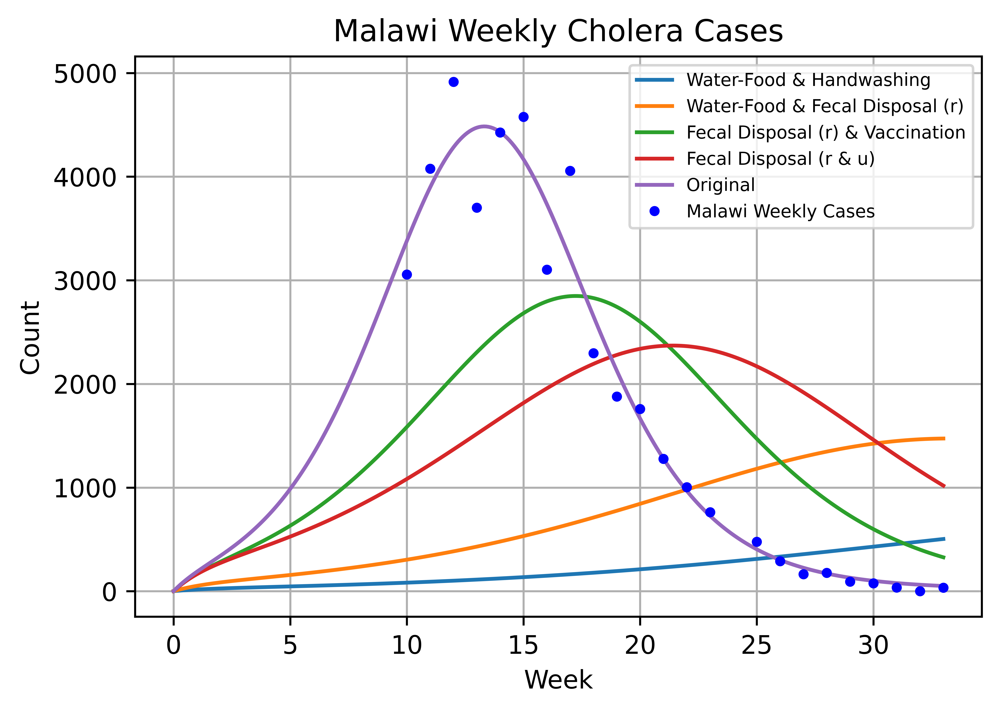

In [ ]:
BestFit2 = BestFit.iloc[0, :].values.flatten().tolist()

# pop = 3500000


a = BestFit2[1]
lamb = BestFit2[2]
sigma = BestFit2[3]
ratio = BestFit2[4]
burnin = BestFit2[5]
bact = BestFit2[6]
B0 = bact/K
q_A = q_I/ratio

print('a=', a)
print('lambda=', lamb)
print('sigma=', sigma)
print('ratio=', ratio)
print('q_A=', q_A)
print('burnin = ', burnin)

# fit = Cholera_fitter(Cholera_model, t, a, thresh, lamb, c_s, c_h, c_f_I, c_f_A, sigma, mu, nu, p_I, p_A, q_I, q_A, r, data_malawi, 'Malawi', pop, burnin)
# fit
# output_fit = Cholera_solver(Cholera_model, t, a, thresh, lamb, c_s, c_h, c_f_I, c_f_A, sigma, mu, nu, p_I, p_A, q_I, q_A, r, pop)

plt.figure(1, [6, 4], dpi=600)
plt.grid()
plt.title('Malawi Weekly Cholera Cases')
for i in range(len(Compliance)):
      c_s = Compliance['c_s'][i]
      c_h = Compliance['c_h'][i]
      c_f_I = Compliance['c_f_I'][i]
      c_f_A = Compliance['c_f_A'][i]
      nu = Compliance['nu'][i]
      title = Compliance['Case'][i]
      output_fit = Cholera_solver(Cholera_model, t, a, thresh, lamb, c_s, c_h, c_f_I, c_f_A, sigma, mu, nu, p_I, p_A, q_I, q_A, r, pop)
      plt.plot(output_fit['time'], output_fit['I(t)'], '-', label=title)
plt.plot(data_malawi['Date']+burnin, data_malawi['Malawi'], 'b.', label='Malawi Weekly Cases')
plt.xlabel('Week')
plt.ylabel('Count')
plt.legend(prop={'size': 7})

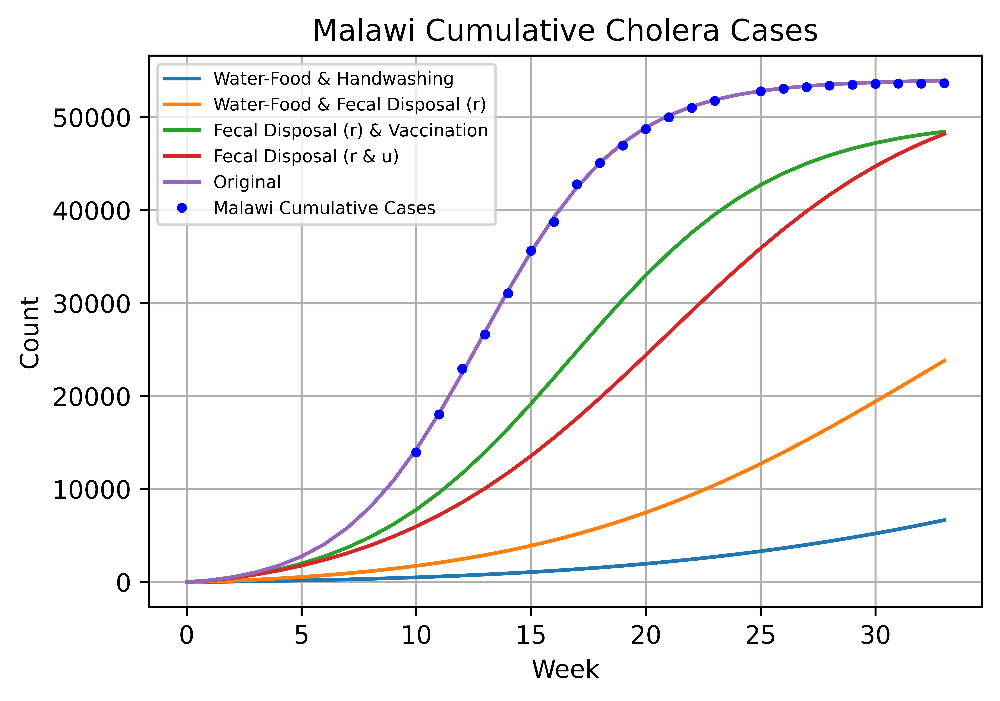

In [ ]:
data_malawi_cumul = pd.read_csv(path_to_data + "Malawi_cumul.csv", sep=",", header=0)

data_malawi['Cumul'] = data_malawi_cumul['Malawi_cumul']

# data_malawi['Cumul'] = np.cumsum(data_malawi['Malawi'])
data_malawi

# Sum = Cholera_fitter_cumul(Cholera_model, t, a, thresh, lamb, c_s, c_h, c_f_I, c_f_A, sigma, mu, nu, p_I, p_A, q_I, q_A, r, data_malawi, 'Cumul', pop, burnin)
# print(Sum)

# cumul_fit = Cholera_solver_cumul(Cholera_model, t, a, thresh, lamb, c_s, c_h, c_f_I, c_f_A, sigma, mu, nu, p_I, p_A, q_I, q_A, r, data_malawi, 'Cumul', pop, burnin)


plt.figure(1, [6, 4], dpi=600)
plt.grid()
plt.title('Malawi Cumulative Cholera Cases')
for i in range(len(Compliance)):
      c_s = Compliance['c_s'][i]
      c_h = Compliance['c_h'][i]
      c_f_I = Compliance['c_f_I'][i]
      c_f_A = Compliance['c_f_A'][i]
      nu = Compliance['nu'][i]
      title = Compliance['Case'][i]
      cumul_fit = Cholera_solver_cumul(Cholera_model, t, a, thresh, lamb, c_s, c_h, c_f_I, c_f_A, sigma, mu, nu, p_I, p_A, q_I, q_A, r, data_malawi, 'Cumul', pop, burnin)
      plt.plot(cumul_fit['time'], cumul_fit['I(t)_cumul'], '-', label=title)
plt.plot(data_malawi['Date']+burnin, data_malawi['Cumul']+cumul_fit['I(t)_cumul'][burnin], 'b.', label='Malawi Cumulative Cases')
plt.xlabel('Week')
plt.ylabel('Count')
plt.legend(prop={'size': 7})